In [23]:
import pandas as pd

In [24]:
# import data files
# young_train_df = pd.read_csv("young_train_df.csv")
young_test_df = pd.read_csv("young_test_df.csv")
# old_train_df = pd.read_csv("old_train_df.csv")
old_test_df = pd.read_csv("old_test_df.csv")

In [25]:
test_df = pd.concat([young_test_df, old_test_df], ignore_index=True)

In [26]:
test_df.columns

Index(['MRID', 'Age', 'Diagnosis', 'Sex', 'sth', 'B', 'Patient ID', 'Date',
       'Age-rounded', 'Age_Group', 'dataset'],
      dtype='object')

In [27]:
# Group by 'Patient ID'
grouped = test_df.groupby('Patient ID')

# Calculate the age range and count of scans for each patient
patient_scans = grouped.agg(
    age_range = ('Age', lambda x: x.max() - x.min()),  # Calculate the range of ages
    num_scans = ('Patient ID', 'size')  # Count the number of scans (rows) per group
).reset_index()

# Additional aggregation to get distinct diagnoses
diagnosis_data = test_df.groupby('Patient ID')['Diagnosis'].unique().reset_index()
diagnosis_data['Diagnosis'] = diagnosis_data['Diagnosis'].apply(lambda x: ', '.join(sorted(x)))

# Merge this back into the patient_scans DataFrame
patient_scans = patient_scans.merge(diagnosis_data, on='Patient ID', how='left')

# Sort the DataFrame by 'age_range' and 'num_scans', both in descending order
patient_scans = patient_scans.sort_values(by=['age_range', 'num_scans'], ascending=[False, False])

In [28]:
# Filter to exclude patients with only one diagnosis and age range less than two years
patient_scans_filtered = patient_scans[(patient_scans['Diagnosis'].str.contains(',')) & (patient_scans['age_range'] >= 2)]

In [29]:
patient_scans_filtered

,Patient ID,age_range,num_scans,Diagnosis
26,1190,12.783025,5,"AD, CN"
50,4100,7.340178,6,"CN, MCI"
44,4035,4.246407,5,"AD, MCI"
102,4715,4.216290,4,"AD, MCI"
106,4816,4.123203,5,"AD, MCI"
85,4446,4.087611,5,"CN, MCI"
12,604,3.055441,5,"AD, MCI"
13,638,3.033539,6,"AD, MCI"
19,1066,3.008898,3,"AD, MCI"
84,4432,2.127310,2,"AD, MCI"


In [30]:
# Get a list of unique Patient IDs from the filtered DataFrame
filtered_patient_ids = patient_scans_filtered['Patient ID'].unique()

# Filter the original DataFrame to include only rows with these Patient IDs
related_entries = test_df[test_df['Patient ID'].isin(filtered_patient_ids)]

# Select only the required columns
final_table = related_entries[['Patient ID', 'MRID', 'Age-rounded', 'Diagnosis']]

# Calculate the minimum 'Age-rounded' for each 'Patient ID'
min_age = final_table.groupby('Patient ID')['Age-rounded'].transform(min)

# Create a new column 'Type' based on the condition if 'Age-rounded' equals the minimum age for that 'Patient ID'
final_table['Type'] = ['input' if age == min_age else 'ground truth' for age, min_age in zip(final_table['Age-rounded'], min_age)]

# Add a new column 'age-difference' which is the difference between each 'Age-rounded' and the group minimum 'Age-rounded'
final_table['age-difference'] = final_table['Age-rounded'] - min_age

# Sort final_table to visually inspect the changes or prepare for output
final_table.sort_values(by=['Patient ID', 'Age-rounded'], inplace=True)

/tmp/ipykernel_1196667/1089485770.py:11: FutureWarning: The provided callable <built-in function min> is currently using SeriesGroupBy.min. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "min" instead.
  min_age = final_table.groupby('Patient ID')['Age-rounded'].transform(min)
/tmp/ipykernel_1196667/1089485770.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  final_table['Type'] = ['input' if age == min_age else 'ground truth' for age, min_age in zip(final_table['Age-rounded'], min_age)]
/tmp/ipykernel_1196667/1089485770.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead



env: CUDA_DEVICE_ORDER=PCI_BUS_ID
env: CUDA_VISIBLE_DEVICES=1
Using device: cuda
$$$$$$$$$$$$$$$$ Target age: 86.0
Age difference:  0.0
Diagnostic category: MCI
$$$$$$$$$$$$$$$$ Target age: 87.0
Age difference:  1.0
Diagnostic category: MCI


/home/shared/anaconda3/envs/aarongzy_be5740/lib/python3.12/site-packages/torch/nn/modules/instancenorm.py:80: UserWarning: input's size at dim=0 does not match num_features. You can silence this warning by not passing in num_features, which is not used because affine=False
  warnings.warn(f"input's size at dim={feature_dim} does not match num_features. "


Checking dimensions
pred torch.Size([1, 1, 208, 160])
gt: torch.Size([1, 1, 208, 160])
Checking intensity range
pred min: 0.0 pred max: 1.0
gt min: 0.0 gt max: 1.0
diff min: 0.0 gt max: 0.48862773180007935
pred var: tensor(0.1118, device='cuda:0')
gt var: tensor(0.1102, device='cuda:0')


MSE: 0.0019878267776221037
SSIM: 0.9295975565910339
--------


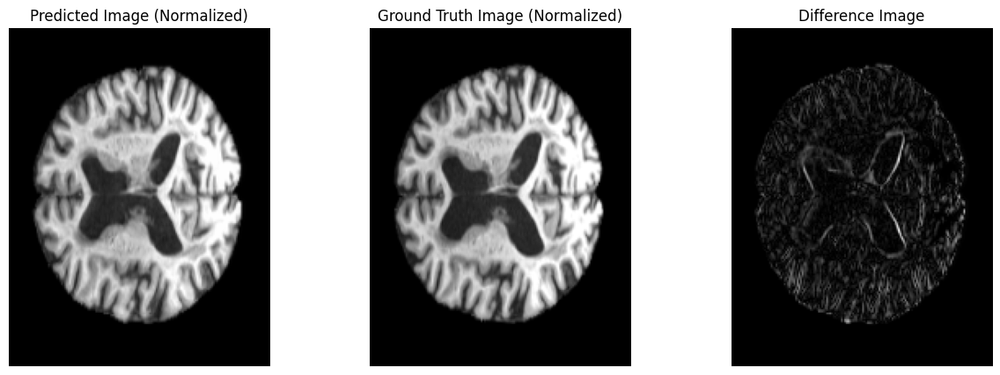

Checking dimensions
pred torch.Size([1, 1, 208, 160])
gt: torch.Size([1, 1, 208, 160])
Checking intensity range
pred min: 0.0 pred max: 1.0
gt min: 0.0 gt max: 1.0
diff min: 0.0 gt max: 0.42009031772613525
pred var: tensor(0.1123, device='cuda:0')
gt var: tensor(0.1103, device='cuda:0')
MSE: 0.0019771938677877188
SSIM: 0.9306945204734802
--------


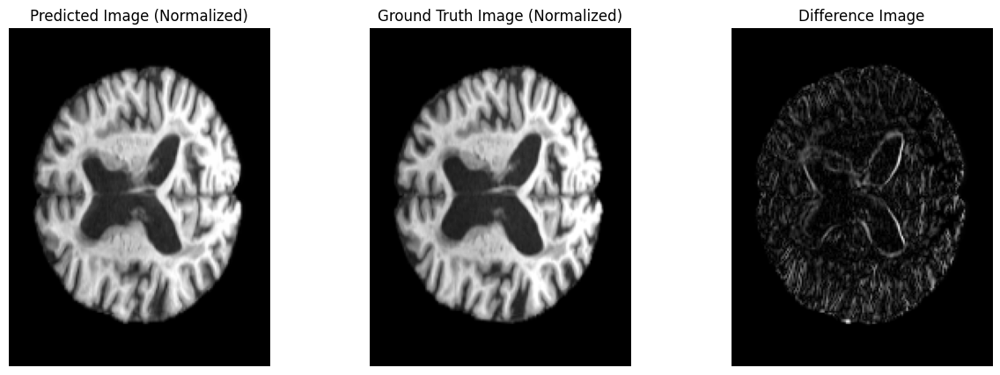

$$$$$$$$$$$$$$$$ Target age: 88.0
Age difference:  2.0
Diagnostic category: AD
Checking dimensions
pred torch.Size([1, 1, 208, 160])
gt: torch.Size([1, 1, 208, 160])
Checking intensity range
pred min: 0.0 pred max: 1.0
gt min: 0.0 gt max: 1.0
diff min: 0.0 gt max: 0.5700277090072632
pred var: tensor(0.1118, device='cuda:0')
gt var: tensor(0.1162, device='cuda:0')
MSE: 0.0032336043659597635
SSIM: 0.905687153339386
--------


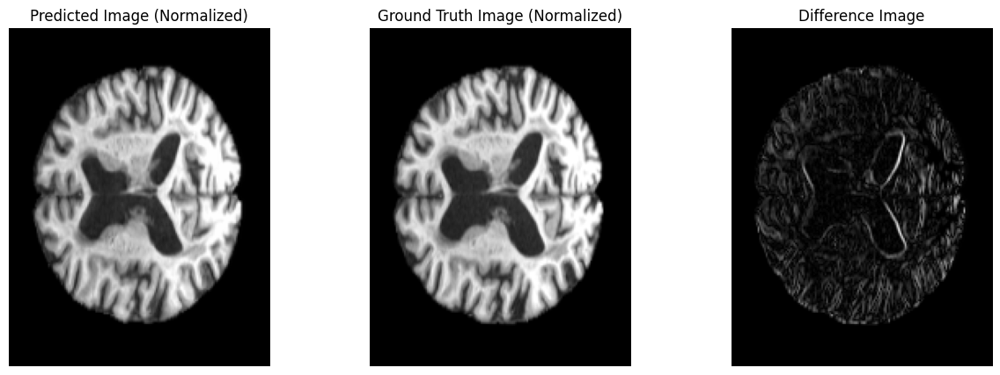

Checking dimensions
pred torch.Size([1, 1, 208, 160])
gt: torch.Size([1, 1, 208, 160])
Checking intensity range
pred min: 0.0 pred max: 1.0
gt min: 0.0 gt max: 1.0
diff min: 0.0 gt max: 0.5980656743049622
pred var: tensor(0.1123, device='cuda:0')
gt var: tensor(0.1165, device='cuda:0')
MSE: 0.0032583782449364662
SSIM: 0.905600368976593
--------


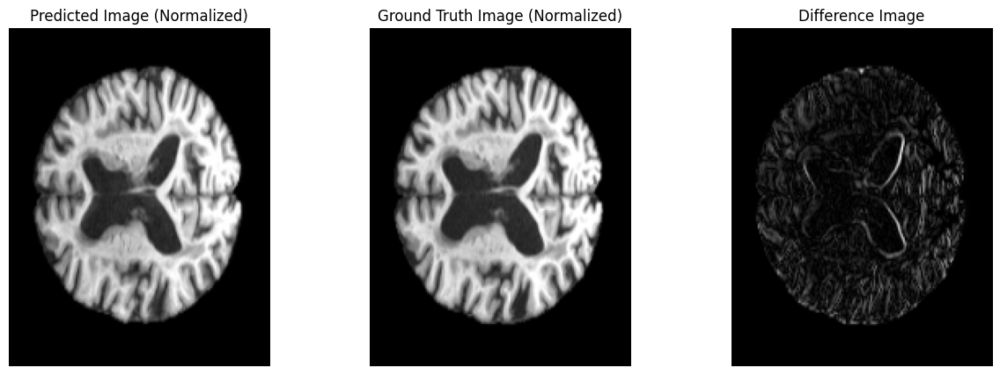

$$$$$$$$$$$$$$$$ Target age: 89.0
Age difference:  3.0
Diagnostic category: AD
Checking dimensions
pred torch.Size([1, 1, 208, 160])
gt: torch.Size([1, 1, 208, 160])
Checking intensity range
pred min: 0.0 pred max: 1.0
gt min: 0.0 gt max: 1.0
diff min: 0.0 gt max: 0.6290848255157471
pred var: tensor(0.1118, device='cuda:0')
gt var: tensor(0.1116, device='cuda:0')
MSE: 0.002477311994880438
SSIM: 0.9161607623100281
--------


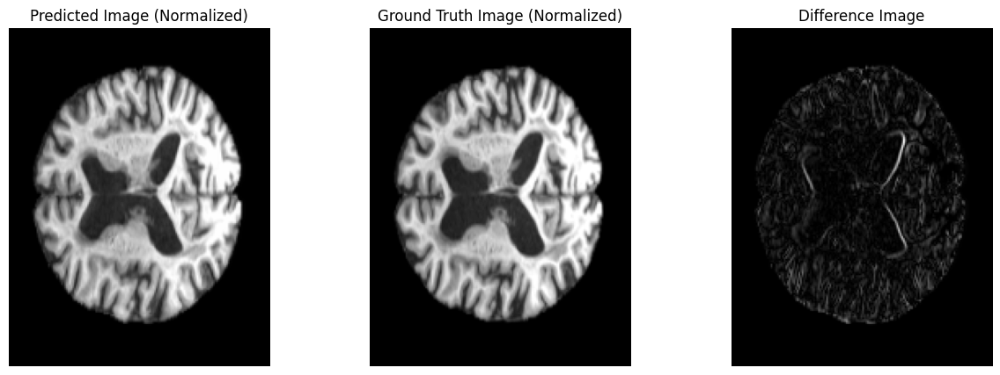

Checking dimensions
pred torch.Size([1, 1, 208, 160])
gt: torch.Size([1, 1, 208, 160])
Checking intensity range
pred min: 0.0 pred max: 1.0
gt min: 0.0 gt max: 1.0
diff min: 0.0 gt max: 0.5694955587387085
pred var: tensor(0.1123, device='cuda:0')
gt var: tensor(0.1113, device='cuda:0')
MSE: 0.0024454088415950537
SSIM: 0.9177119135856628
--------


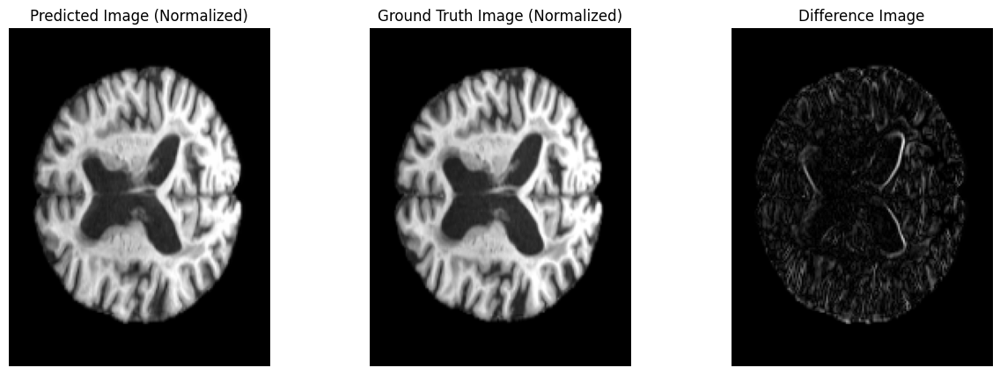

$$$$$$$$$$$$$$$$ Target age: 90.0
Age difference:  4.0
Diagnostic category: AD
Checking dimensions
pred torch.Size([1, 1, 208, 160])
gt: torch.Size([1, 1, 208, 160])
Checking intensity range
pred min: 0.0 pred max: 1.0
gt min: 0.0 gt max: 1.0
diff min: 0.0 gt max: 0.7510153651237488
pred var: tensor(0.1118, device='cuda:0')
gt var: tensor(0.1085, device='cuda:0')
MSE: 0.003558376571163535
SSIM: 0.9006431698799133
--------


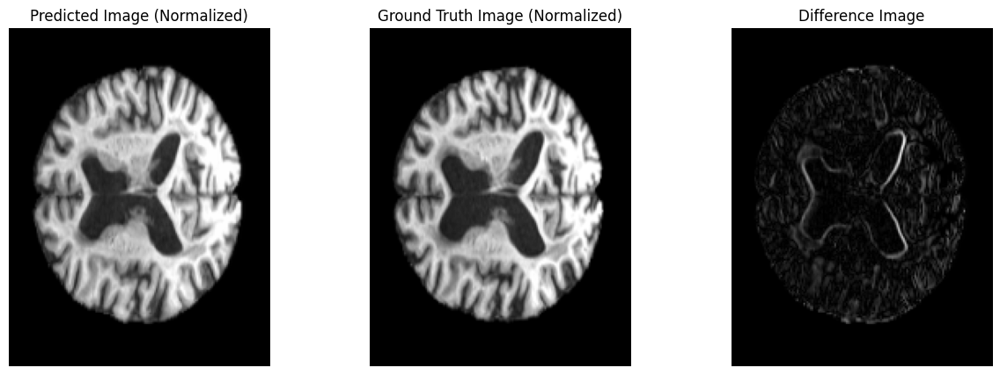

Checking dimensions
pred torch.Size([1, 1, 208, 160])
gt: torch.Size([1, 1, 208, 160])
Checking intensity range
pred min: 0.0 pred max: 1.0
gt min: 0.0 gt max: 1.0
diff min: 0.0 gt max: 0.7279682159423828
pred var: tensor(0.1123, device='cuda:0')
gt var: tensor(0.1083, device='cuda:0')
MSE: 0.0034759079571813345
SSIM: 0.9050752520561218
--------


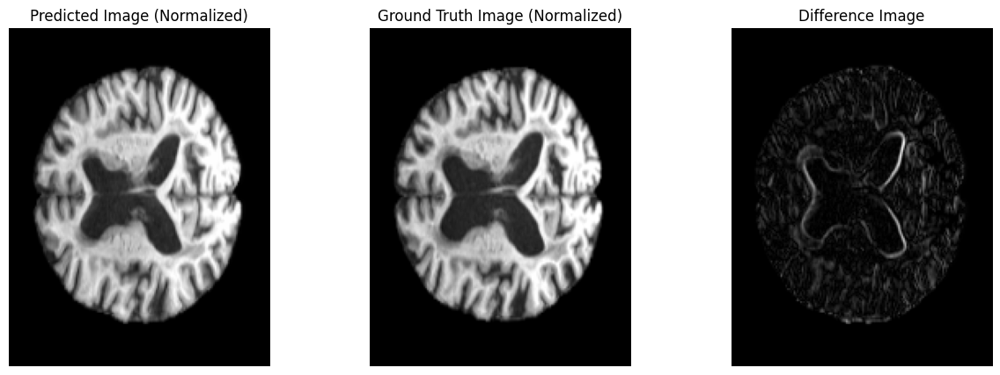

$$$$$$$$$$$$$$$$ Target age: 83.0
Age difference:  0.0
Diagnostic category: MCI
$$$$$$$$$$$$$$$$ Target age: 84.0
Age difference:  1.0
Diagnostic category: MCI
Checking dimensions
pred torch.Size([1, 1, 208, 160])
gt: torch.Size([1, 1, 208, 160])
Checking intensity range
pred min: 0.0 pred max: 1.0
gt min: 0.0 gt max: 1.0
diff min: 0.0 gt max: 0.3490731716156006
pred var: tensor(0.1163, device='cuda:0')
gt var: tensor(0.1155, device='cuda:0')
MSE: 0.0015981150791049004
SSIM: 0.9257020950317383
--------


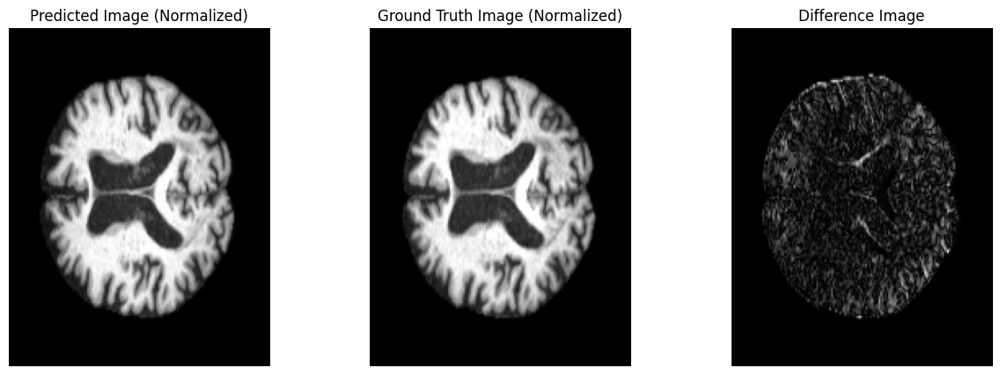

Checking dimensions
pred torch.Size([1, 1, 208, 160])
gt: torch.Size([1, 1, 208, 160])
Checking intensity range
pred min: 0.0 pred max: 1.0
gt min: 0.0 gt max: 1.0
diff min: 0.0 gt max: 0.357838898897171
pred var: tensor(0.1148, device='cuda:0')
gt var: tensor(0.1145, device='cuda:0')
MSE: 0.0015421888092532754
SSIM: 0.9259182214736938
--------


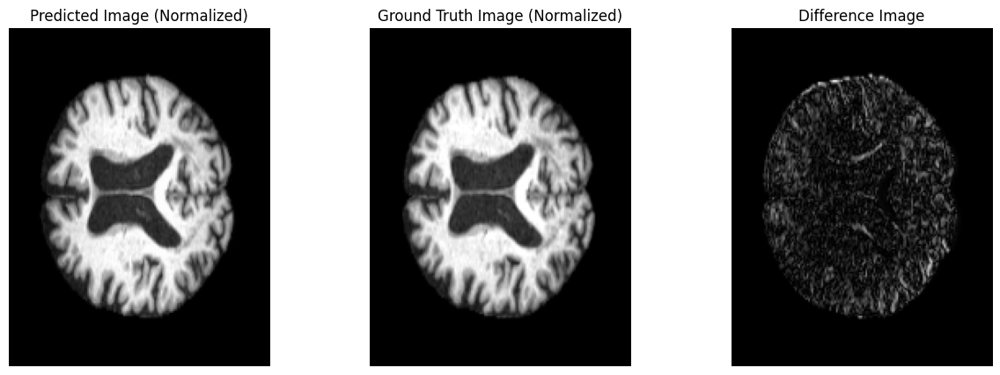

$$$$$$$$$$$$$$$$ Target age: 84.0
Age difference:  1.0
Diagnostic category: AD
Checking dimensions
pred torch.Size([1, 1, 208, 160])
gt: torch.Size([1, 1, 208, 160])
Checking intensity range
pred min: 0.0 pred max: 1.0
gt min: 0.0 gt max: 1.0
diff min: 0.0 gt max: 0.3550516366958618
pred var: tensor(0.1163, device='cuda:0')
gt var: tensor(0.1157, device='cuda:0')
MSE: 0.001332143903709948
SSIM: 0.9319196939468384
--------


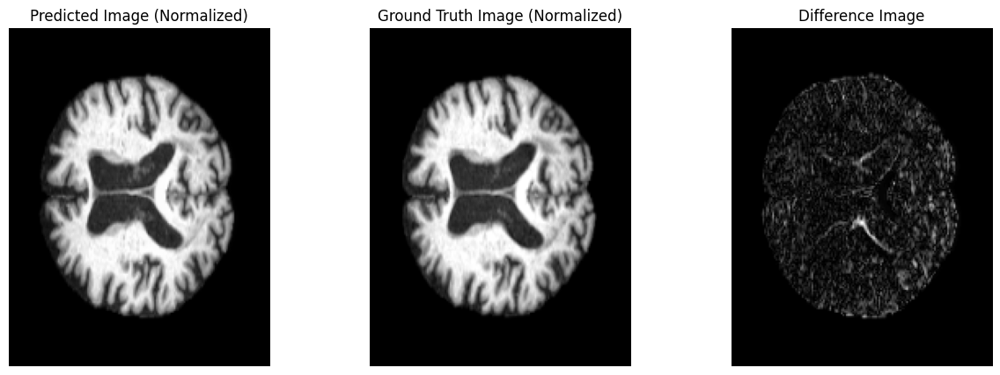

Checking dimensions
pred torch.Size([1, 1, 208, 160])
gt: torch.Size([1, 1, 208, 160])
Checking intensity range
pred min: 0.0 pred max: 1.0
gt min: 0.0 gt max: 1.0
diff min: 0.0 gt max: 0.3171532154083252
pred var: tensor(0.1148, device='cuda:0')
gt var: tensor(0.1148, device='cuda:0')
MSE: 0.0012404595036059618
SSIM: 0.9320288300514221
--------


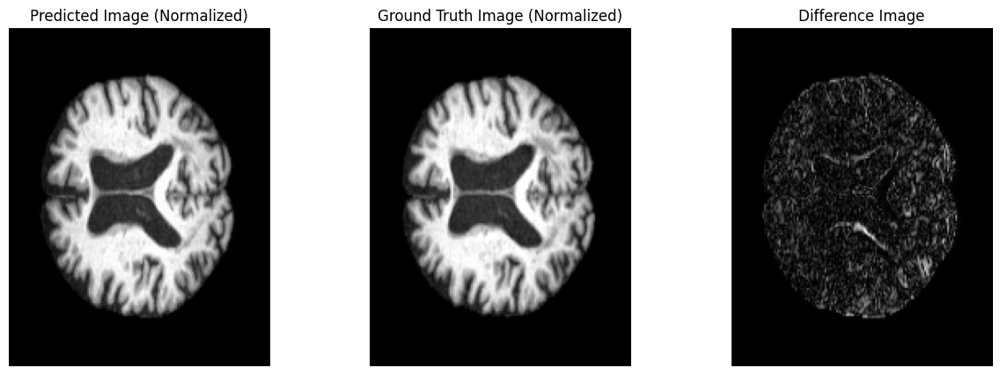

$$$$$$$$$$$$$$$$ Target age: 85.0
Age difference:  2.0
Diagnostic category: AD
Checking dimensions
pred torch.Size([1, 1, 208, 160])
gt: torch.Size([1, 1, 208, 160])
Checking intensity range
pred min: 0.0 pred max: 1.0
gt min: 0.0 gt max: 1.0
diff min: 0.0 gt max: 0.5503414869308472
pred var: tensor(0.1163, device='cuda:0')
gt var: tensor(0.1198, device='cuda:0')
MSE: 0.0024765890557318926
SSIM: 0.9099293351173401
--------


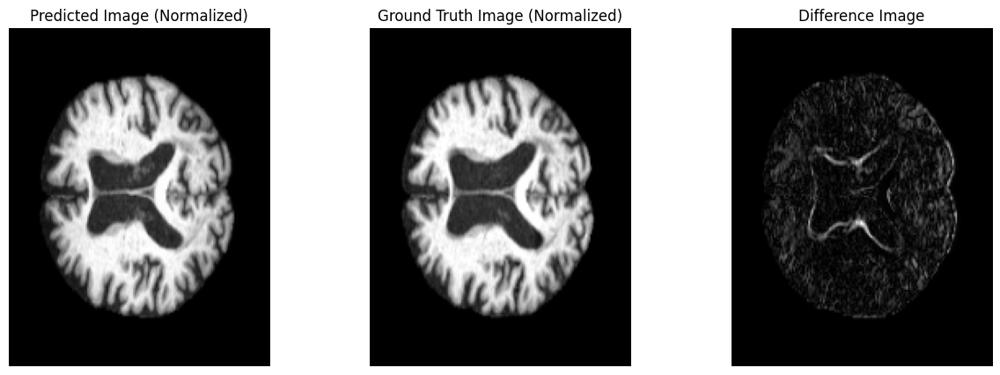

Checking dimensions
pred torch.Size([1, 1, 208, 160])
gt: torch.Size([1, 1, 208, 160])
Checking intensity range
pred min: 0.0 pred max: 1.0
gt min: 0.0 gt max: 1.0
diff min: 0.0 gt max: 0.4610370695590973
pred var: tensor(0.1148, device='cuda:0')
gt var: tensor(0.1188, device='cuda:0')
MSE: 0.002237435895949602
SSIM: 0.9121492505073547
--------


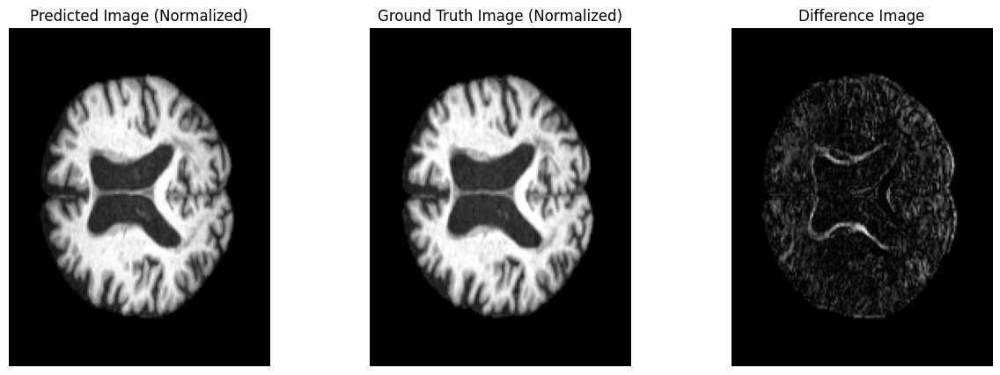

$$$$$$$$$$$$$$$$ Target age: 85.0
Age difference:  2.0
Diagnostic category: AD
Checking dimensions
pred torch.Size([1, 1, 208, 160])
gt: torch.Size([1, 1, 208, 160])
Checking intensity range
pred min: 0.0 pred max: 1.0
gt min: 0.0 gt max: 1.0
diff min: 0.0 gt max: 0.5575494766235352
pred var: tensor(0.1163, device='cuda:0')
gt var: tensor(0.1134, device='cuda:0')
MSE: 0.0026243748143315315
SSIM: 0.9081230163574219
--------


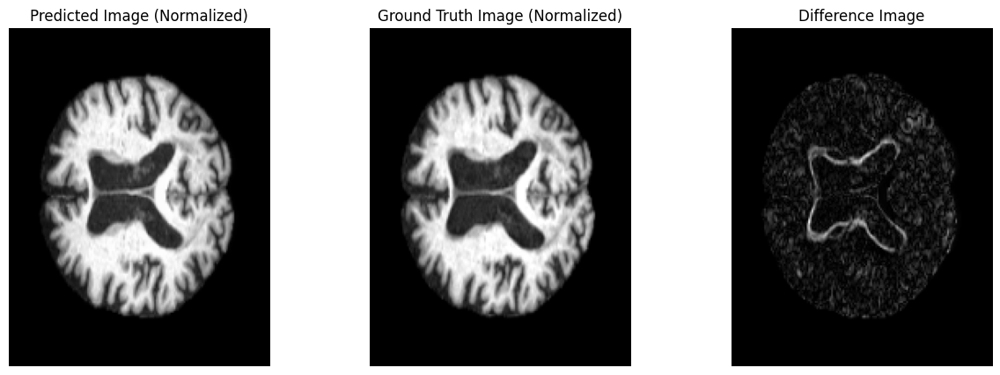

Checking dimensions
pred torch.Size([1, 1, 208, 160])
gt: torch.Size([1, 1, 208, 160])
Checking intensity range
pred min: 0.0 pred max: 1.0
gt min: 0.0 gt max: 1.0
diff min: 0.0 gt max: 0.45812535285949707
pred var: tensor(0.1148, device='cuda:0')
gt var: tensor(0.1120, device='cuda:0')
MSE: 0.002470036968588829
SSIM: 0.9082875847816467
--------


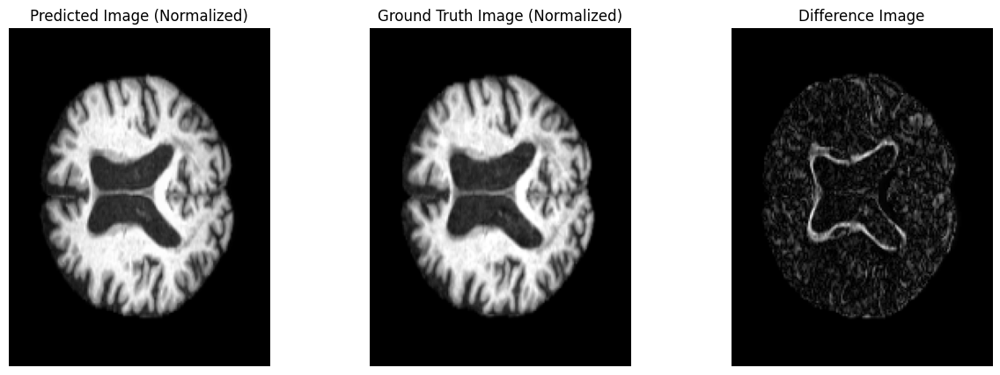

$$$$$$$$$$$$$$$$ Target age: 86.0
Age difference:  3.0
Diagnostic category: AD
Checking dimensions
pred torch.Size([1, 1, 208, 160])
gt: torch.Size([1, 1, 208, 160])
Checking intensity range
pred min: 0.0 pred max: 1.0
gt min: 0.0 gt max: 1.0
diff min: 0.0 gt max: 0.5723521113395691
pred var: tensor(0.1163, device='cuda:0')
gt var: tensor(0.1107, device='cuda:0')
MSE: 0.002928028581663966
SSIM: 0.9036637544631958
--------


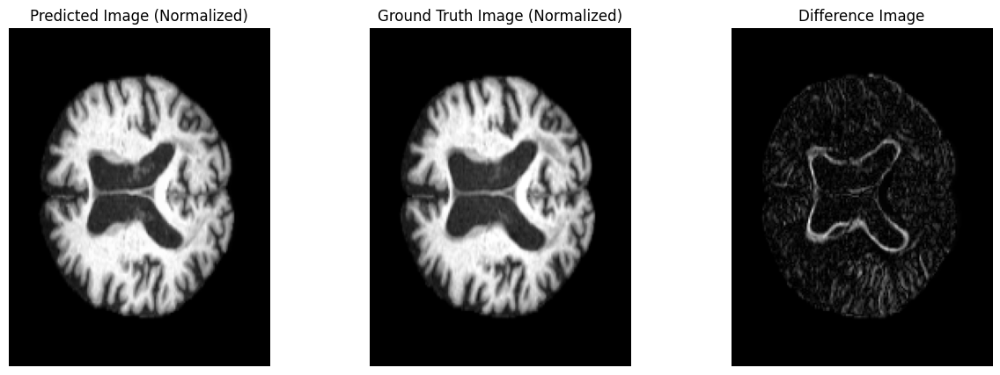

Checking dimensions
pred torch.Size([1, 1, 208, 160])
gt: torch.Size([1, 1, 208, 160])
Checking intensity range
pred min: 0.0 pred max: 1.0
gt min: 0.0 gt max: 1.0
diff min: 0.0 gt max: 0.5991106033325195
pred var: tensor(0.1148, device='cuda:0')
gt var: tensor(0.1101, device='cuda:0')
MSE: 0.0028449255041778088
SSIM: 0.9019607901573181
--------


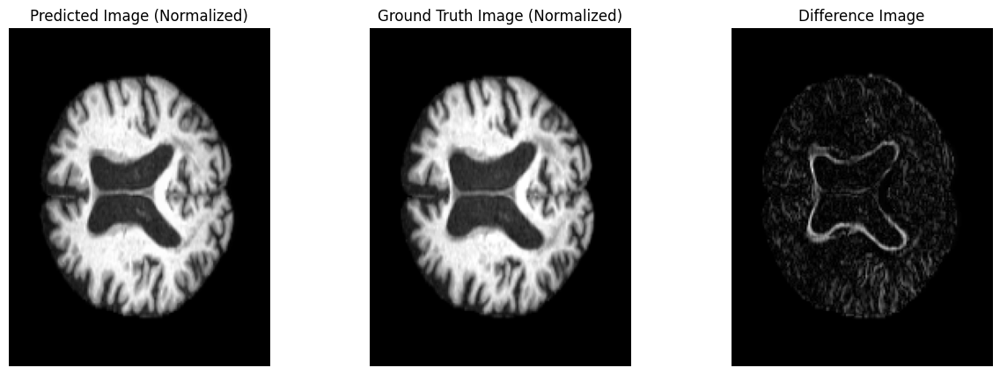

$$$$$$$$$$$$$$$$ Target age: 72.0
Age difference:  0.0
Diagnostic category: MCI
$$$$$$$$$$$$$$$$ Target age: 74.0
Age difference:  2.0
Diagnostic category: AD
Checking dimensions
pred torch.Size([1, 1, 208, 160])
gt: torch.Size([1, 1, 208, 160])
Checking intensity range
pred min: 0.0 pred max: 1.0
gt min: 0.0 gt max: 1.0
diff min: 0.0 gt max: 0.5154938697814941
pred var: tensor(0.1283, device='cuda:0')
gt var: tensor(0.1233, device='cuda:0')
MSE: 0.0033635529689490795
SSIM: 0.9141722321510315
--------


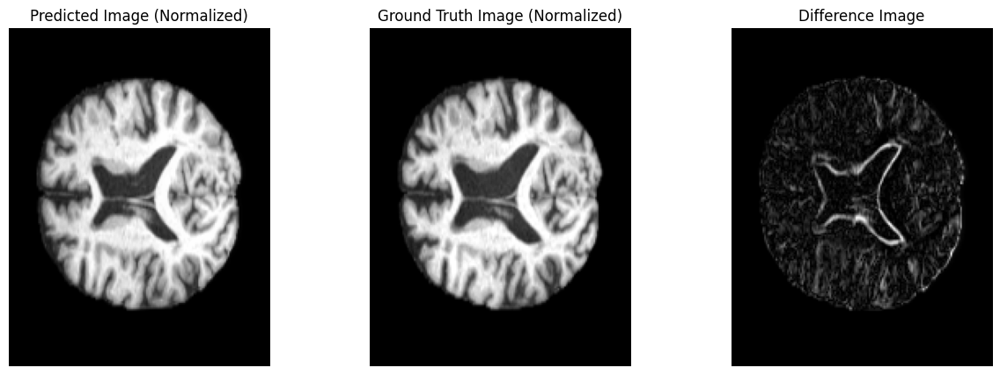

Checking dimensions
pred torch.Size([1, 1, 208, 160])
gt: torch.Size([1, 1, 208, 160])
Checking intensity range
pred min: 0.0 pred max: 1.0
gt min: 0.0 gt max: 1.0
diff min: 0.0 gt max: 0.5111902356147766
pred var: tensor(0.1279, device='cuda:0')
gt var: tensor(0.1231, device='cuda:0')
MSE: 0.0029989706818014383
SSIM: 0.9163653254508972
--------


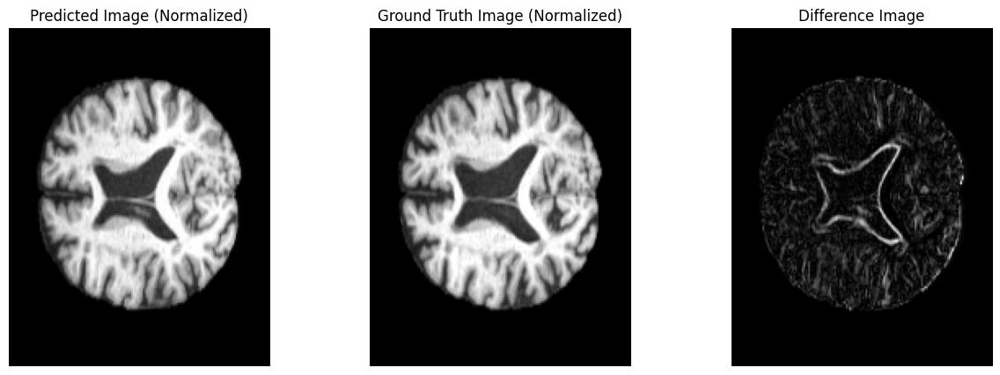

$$$$$$$$$$$$$$$$ Target age: 75.0
Age difference:  3.0
Diagnostic category: AD
Checking dimensions
pred torch.Size([1, 1, 208, 160])
gt: torch.Size([1, 1, 208, 160])
Checking intensity range
pred min: 0.0 pred max: 1.0
gt min: 0.0 gt max: 1.0
diff min: 0.0 gt max: 0.6121331453323364
pred var: tensor(0.1283, device='cuda:0')
gt var: tensor(0.1185, device='cuda:0')
MSE: 0.006141876336187124
SSIM: 0.8281470537185669
--------


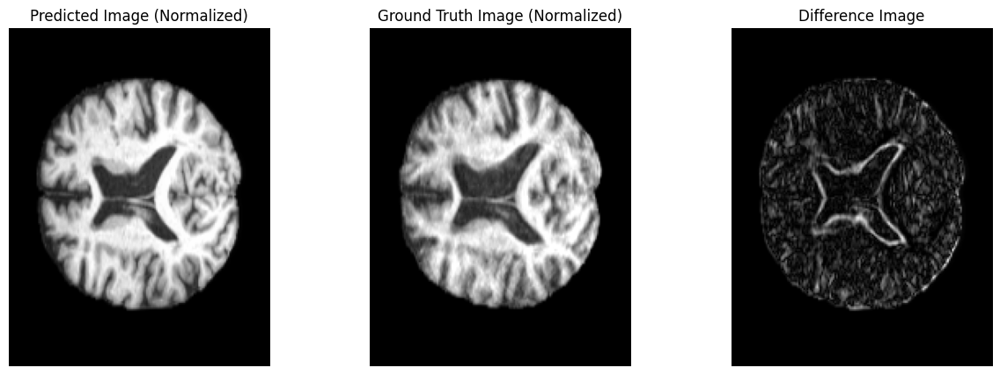

Checking dimensions
pred torch.Size([1, 1, 208, 160])
gt: torch.Size([1, 1, 208, 160])
Checking intensity range
pred min: 0.0 pred max: 1.0
gt min: 0.0 gt max: 1.0
diff min: 0.0 gt max: 0.5651217699050903
pred var: tensor(0.1279, device='cuda:0')
gt var: tensor(0.1181, device='cuda:0')
MSE: 0.005772205535322428
SSIM: 0.8305585384368896
--------


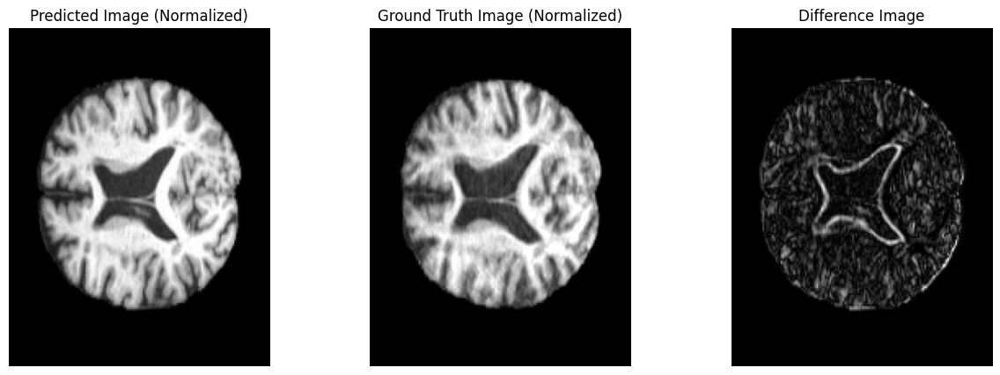

$$$$$$$$$$$$$$$$ Target age: 76.0
Age difference:  0.0
Diagnostic category: CN
$$$$$$$$$$$$$$$$ Target age: 77.0
Age difference:  1.0
Diagnostic category: CN
Checking dimensions
pred torch.Size([1, 1, 208, 160])
gt: torch.Size([1, 1, 208, 160])
Checking intensity range
pred min: 0.0 pred max: 1.0
gt min: 0.0 gt max: 1.0
diff min: 0.0 gt max: 0.316793292760849
pred var: tensor(0.1286, device='cuda:0')
gt var: tensor(0.1280, device='cuda:0')
MSE: 0.0006036005797795951
SSIM: 0.969211220741272
--------


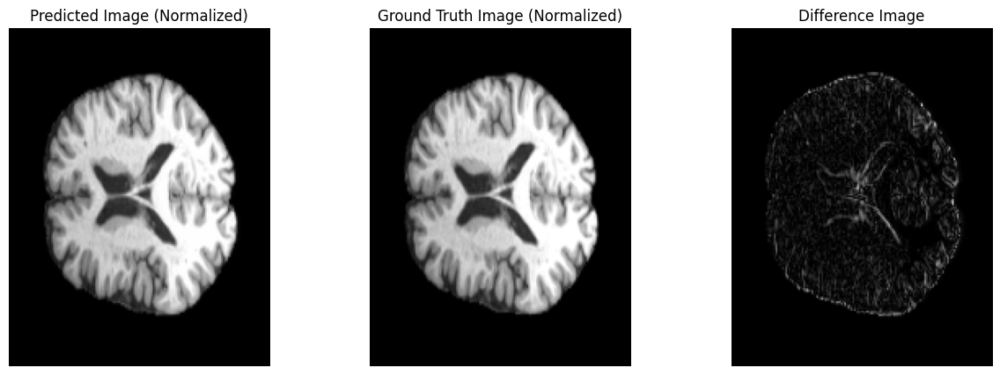

Checking dimensions
pred torch.Size([1, 1, 208, 160])
gt: torch.Size([1, 1, 208, 160])
Checking intensity range
pred min: 0.0 pred max: 1.0
gt min: 0.0 gt max: 1.0
diff min: 0.0 gt max: 0.41444745659828186
pred var: tensor(0.1272, device='cuda:0')
gt var: tensor(0.1265, device='cuda:0')
MSE: 0.0006023880559951067
SSIM: 0.9699746966362
--------


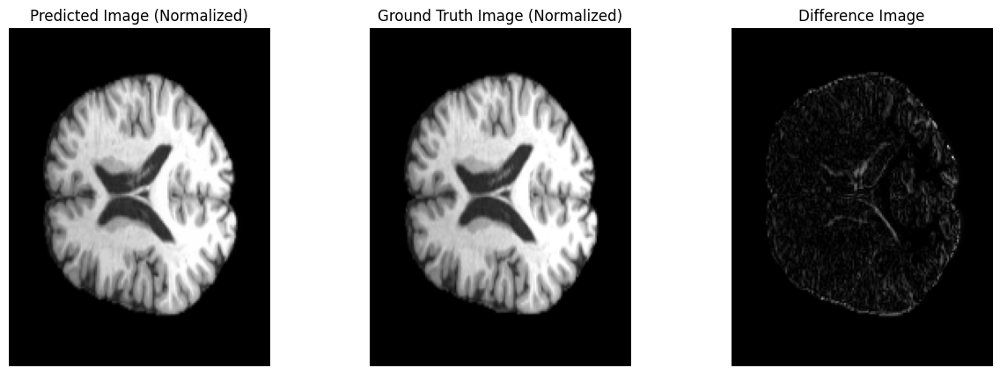

$$$$$$$$$$$$$$$$ Target age: 77.0
Age difference:  1.0
Diagnostic category: CN
Checking dimensions
pred torch.Size([1, 1, 208, 160])
gt: torch.Size([1, 1, 208, 160])
Checking intensity range
pred min: 0.0 pred max: 1.0
gt min: 0.0 gt max: 1.0
diff min: 0.0 gt max: 0.34121304750442505
pred var: tensor(0.1286, device='cuda:0')
gt var: tensor(0.1294, device='cuda:0')
MSE: 0.00047251750947907567
SSIM: 0.974600076675415
--------


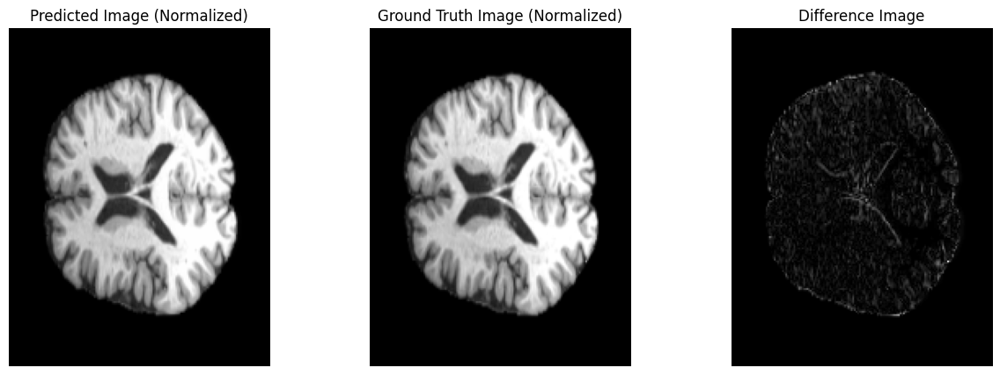

Checking dimensions
pred torch.Size([1, 1, 208, 160])
gt: torch.Size([1, 1, 208, 160])
Checking intensity range
pred min: 0.0 pred max: 1.0
gt min: 0.0 gt max: 1.0
diff min: 0.0 gt max: 0.2390669882297516
pred var: tensor(0.1272, device='cuda:0')
gt var: tensor(0.1278, device='cuda:0')
MSE: 0.00047775465645827353
SSIM: 0.9743531346321106
--------


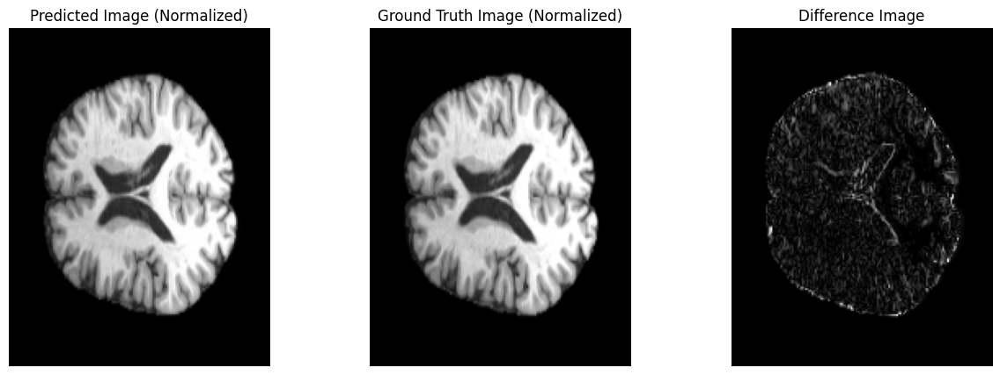

$$$$$$$$$$$$$$$$ Target age: 78.0
Age difference:  2.0
Diagnostic category: CN
Checking dimensions
pred torch.Size([1, 1, 208, 160])
gt: torch.Size([1, 1, 208, 160])
Checking intensity range
pred min: 0.0 pred max: 1.0
gt min: 0.0 gt max: 1.0
diff min: 0.0 gt max: 0.27410390973091125
pred var: tensor(0.1286, device='cuda:0')
gt var: tensor(0.1279, device='cuda:0')
MSE: 0.0008451470057480037
SSIM: 0.9598742127418518
--------


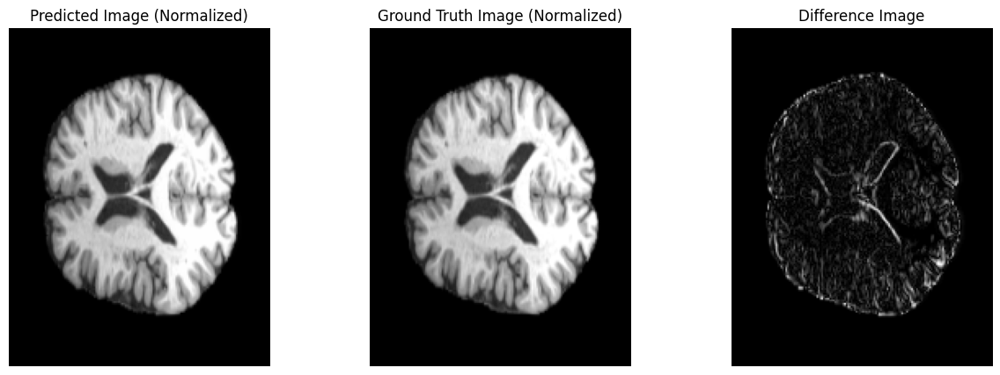

Checking dimensions
pred torch.Size([1, 1, 208, 160])
gt: torch.Size([1, 1, 208, 160])
Checking intensity range
pred min: 0.0 pred max: 1.0
gt min: 0.0 gt max: 1.0
diff min: 0.0 gt max: 0.41147351264953613
pred var: tensor(0.1272, device='cuda:0')
gt var: tensor(0.1266, device='cuda:0')
MSE: 0.0007975836051627994
SSIM: 0.9604659080505371
--------


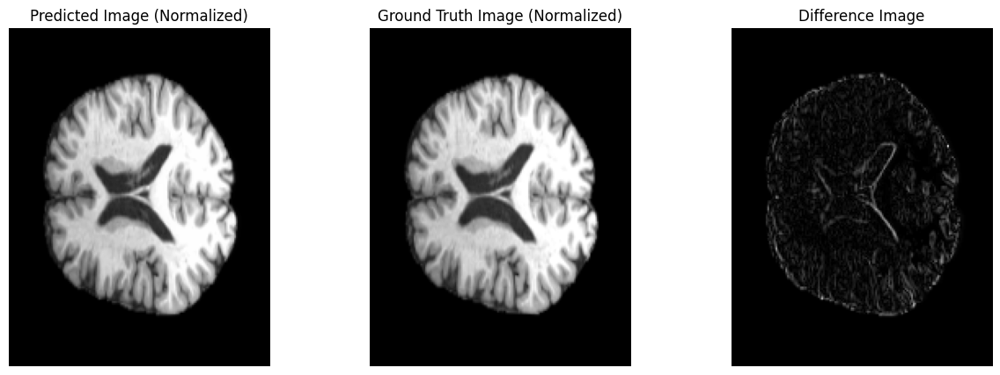

$$$$$$$$$$$$$$$$ Target age: 89.0
Age difference:  13.0
Diagnostic category: AD
Checking dimensions
pred torch.Size([1, 1, 208, 160])
gt: torch.Size([1, 1, 208, 160])
Checking intensity range
pred min: 0.0 pred max: 1.0
gt min: 0.0 gt max: 1.0
diff min: 0.0 gt max: 0.7638604640960693
pred var: tensor(0.1286, device='cuda:0')
gt var: tensor(0.1108, device='cuda:0')
MSE: 0.014471692964434624
SSIM: 0.7605310678482056
--------


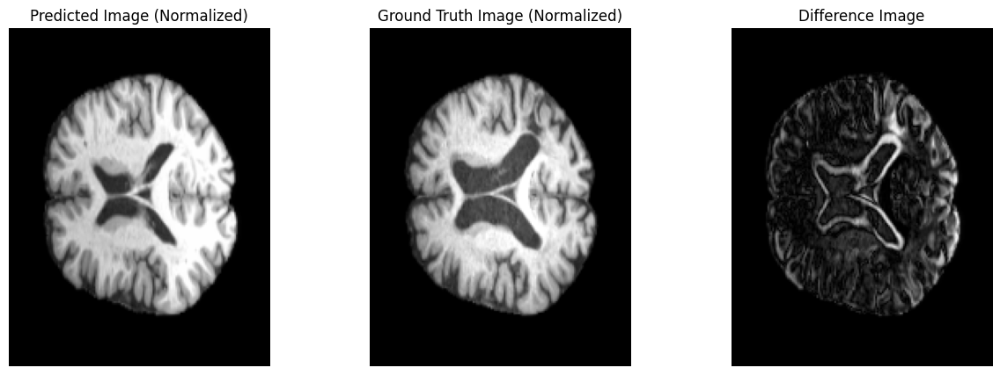

Checking dimensions
pred torch.Size([1, 1, 208, 160])
gt: torch.Size([1, 1, 208, 160])
Checking intensity range
pred min: 0.0 pred max: 1.0
gt min: 0.0 gt max: 1.0
diff min: 0.0 gt max: 0.7920925617218018
pred var: tensor(0.1272, device='cuda:0')
gt var: tensor(0.1095, device='cuda:0')
MSE: 0.013693382032215595
SSIM: 0.7688611149787903
--------


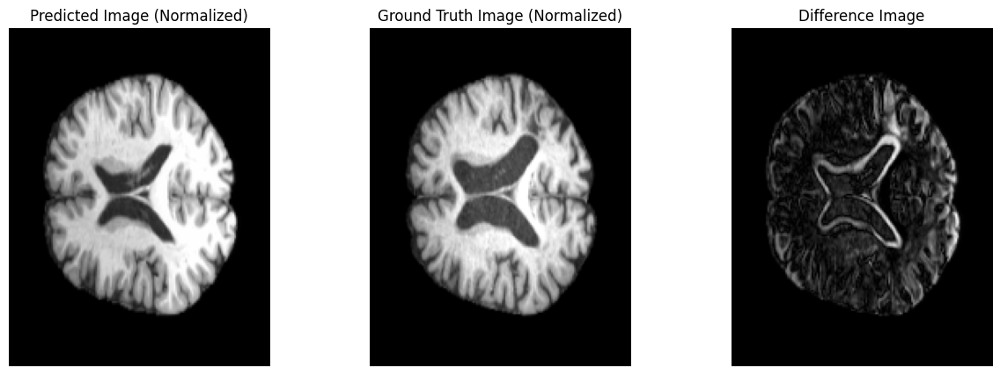

$$$$$$$$$$$$$$$$ Target age: 72.0
Age difference:  0.0
Diagnostic category: MCI
$$$$$$$$$$$$$$$$ Target age: 73.0
Age difference:  1.0
Diagnostic category: MCI
Checking dimensions
pred torch.Size([1, 1, 208, 160])
gt: torch.Size([1, 1, 208, 160])
Checking intensity range
pred min: 0.0 pred max: 1.0
gt min: 0.0 gt max: 1.0
diff min: 0.0 gt max: 0.3434537947177887
pred var: tensor(0.1061, device='cuda:0')
gt var: tensor(0.1100, device='cuda:0')
MSE: 0.0009022205485962331
SSIM: 0.9067941904067993
--------


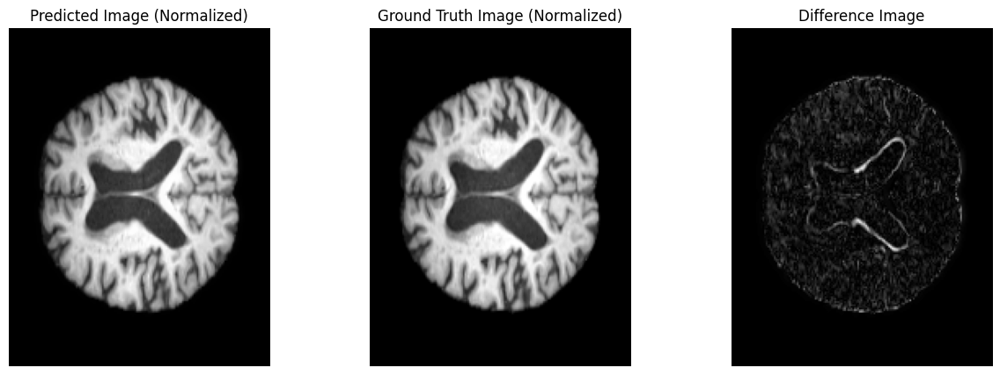

Checking dimensions
pred torch.Size([1, 1, 208, 160])
gt: torch.Size([1, 1, 208, 160])
Checking intensity range
pred min: 0.0 pred max: 1.0
gt min: 0.0 gt max: 1.0
diff min: 0.0 gt max: 0.30470094084739685
pred var: tensor(0.1045, device='cuda:0')
gt var: tensor(0.1087, device='cuda:0')
MSE: 0.0008269461104646325
SSIM: 0.9155322313308716
--------


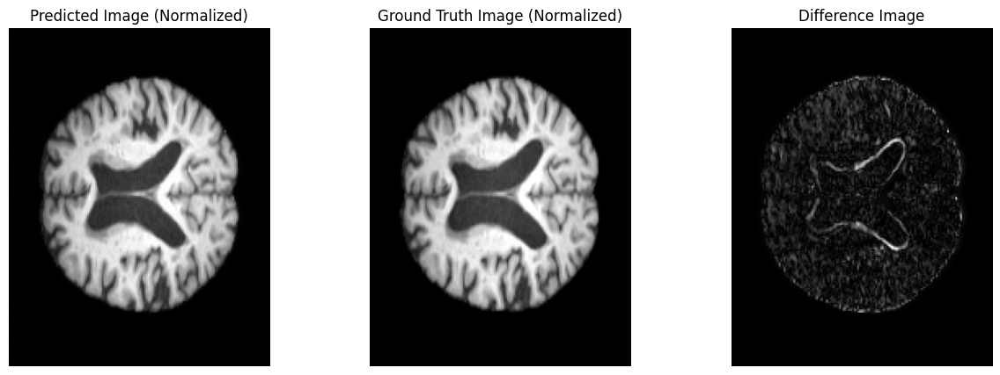

$$$$$$$$$$$$$$$$ Target age: 74.0
Age difference:  2.0
Diagnostic category: AD
Checking dimensions
pred torch.Size([1, 1, 208, 160])
gt: torch.Size([1, 1, 208, 160])
Checking intensity range
pred min: 0.0 pred max: 1.0
gt min: 0.0 gt max: 1.0
diff min: 0.0 gt max: 0.4312579035758972
pred var: tensor(0.1061, device='cuda:0')
gt var: tensor(0.1037, device='cuda:0')
MSE: 0.0014622157905250788
SSIM: 0.8869150876998901
--------


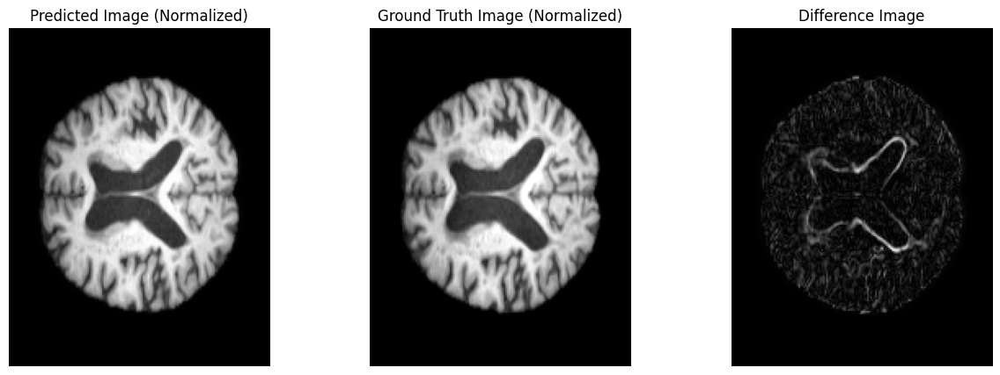

Checking dimensions
pred torch.Size([1, 1, 208, 160])
gt: torch.Size([1, 1, 208, 160])
Checking intensity range
pred min: 0.0 pred max: 1.0
gt min: 0.0 gt max: 1.0
diff min: 0.0 gt max: 0.3999379277229309
pred var: tensor(0.1045, device='cuda:0')
gt var: tensor(0.1026, device='cuda:0')
MSE: 0.001369059318676591
SSIM: 0.8961052894592285
--------


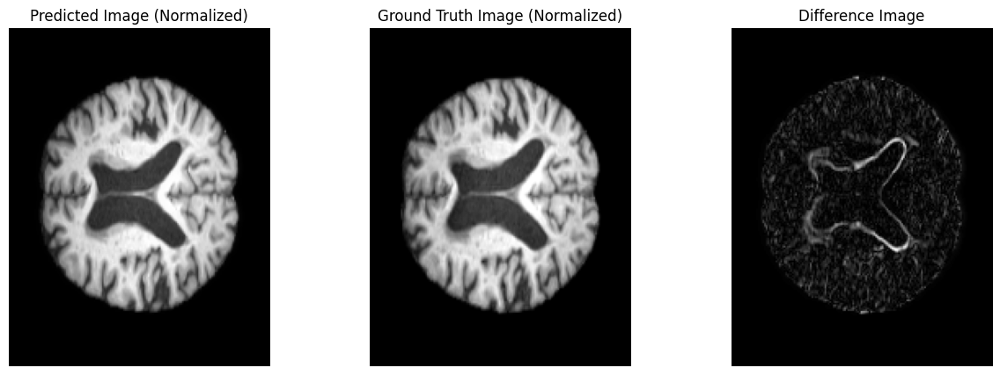

$$$$$$$$$$$$$$$$ Target age: 75.0
Age difference:  3.0
Diagnostic category: AD
Checking dimensions
pred torch.Size([1, 1, 208, 160])
gt: torch.Size([1, 1, 208, 160])
Checking intensity range
pred min: 0.0 pred max: 1.0
gt min: 0.0 gt max: 1.0
diff min: 0.0 gt max: 0.6572955846786499
pred var: tensor(0.1061, device='cuda:0')
gt var: tensor(0.1031, device='cuda:0')
MSE: 0.003063511336222291
SSIM: 0.8563321828842163
--------


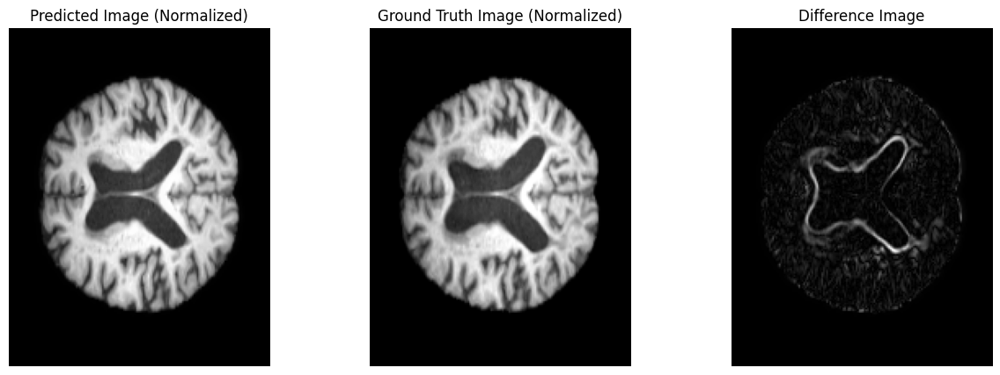

Checking dimensions
pred torch.Size([1, 1, 208, 160])
gt: torch.Size([1, 1, 208, 160])
Checking intensity range
pred min: 0.0 pred max: 1.0
gt min: 0.0 gt max: 1.0
diff min: 0.0 gt max: 0.6498417258262634
pred var: tensor(0.1045, device='cuda:0')
gt var: tensor(0.1020, device='cuda:0')
MSE: 0.002906413283199072
SSIM: 0.8673327565193176
--------


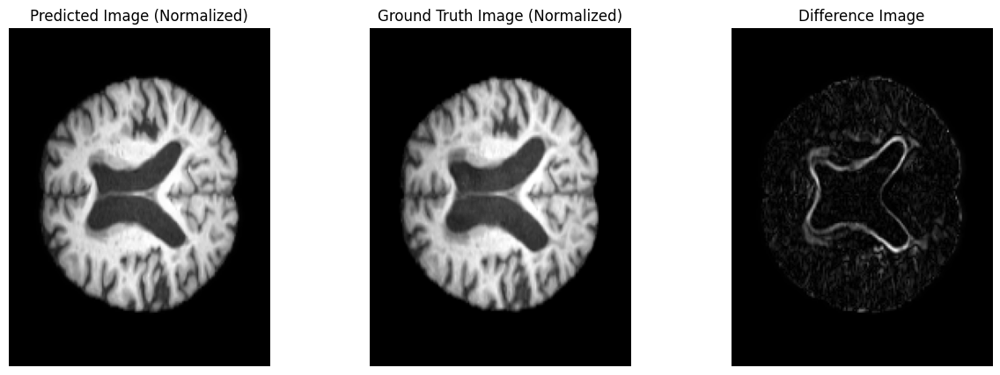

$$$$$$$$$$$$$$$$ Target age: 77.0
Age difference:  5.0
Diagnostic category: AD
Checking dimensions
pred torch.Size([1, 1, 208, 160])
gt: torch.Size([1, 1, 208, 160])
Checking intensity range
pred min: 0.0 pred max: 1.0
gt min: 0.0 gt max: 1.0
diff min: 0.0 gt max: 0.8252954483032227
pred var: tensor(0.1061, device='cuda:0')
gt var: tensor(0.0940, device='cuda:0')
MSE: 0.00976595375686884
SSIM: 0.7652577757835388
--------


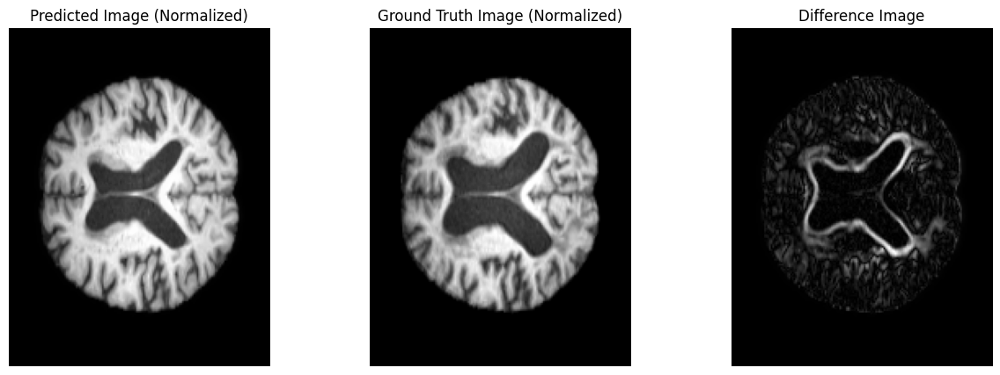

Checking dimensions
pred torch.Size([1, 1, 208, 160])
gt: torch.Size([1, 1, 208, 160])
Checking intensity range
pred min: 0.0 pred max: 1.0
gt min: 0.0 gt max: 1.0
diff min: 0.0 gt max: 0.7948908805847168
pred var: tensor(0.1045, device='cuda:0')
gt var: tensor(0.0934, device='cuda:0')
MSE: 0.009508270770311356
SSIM: 0.7739625573158264
--------


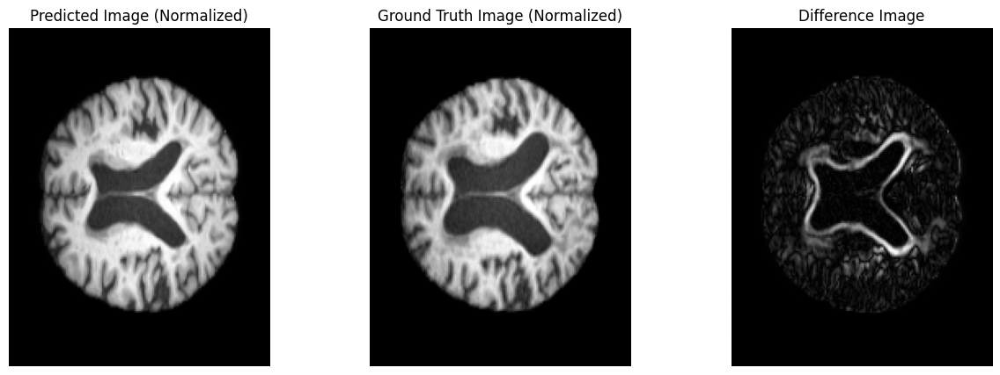

$$$$$$$$$$$$$$$$ Target age: 78.0
Age difference:  0.0
Diagnostic category: CN
$$$$$$$$$$$$$$$$ Target age: 79.0
Age difference:  1.0
Diagnostic category: CN
Checking dimensions
pred torch.Size([1, 1, 208, 160])
gt: torch.Size([1, 1, 208, 160])
Checking intensity range
pred min: 0.0 pred max: 1.0
gt min: 0.0 gt max: 1.0
diff min: 0.0 gt max: 0.23783084750175476
pred var: tensor(0.0963, device='cuda:0')
gt var: tensor(0.0988, device='cuda:0')
MSE: 0.0005149643402546644
SSIM: 0.9445749521255493
--------


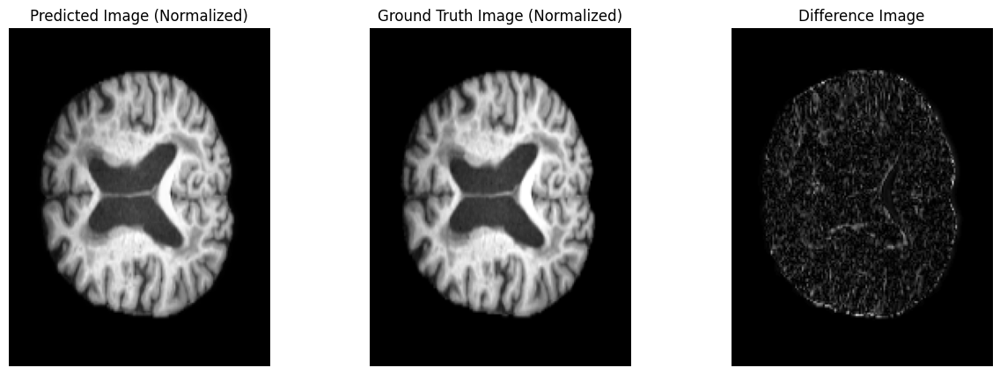

Checking dimensions
pred torch.Size([1, 1, 208, 160])
gt: torch.Size([1, 1, 208, 160])
Checking intensity range
pred min: 0.0 pred max: 1.0
gt min: 0.0 gt max: 1.0
diff min: 0.0 gt max: 0.2554500997066498
pred var: tensor(0.0958, device='cuda:0')
gt var: tensor(0.0980, device='cuda:0')
MSE: 0.0004894792218692601
SSIM: 0.9543583989143372
--------


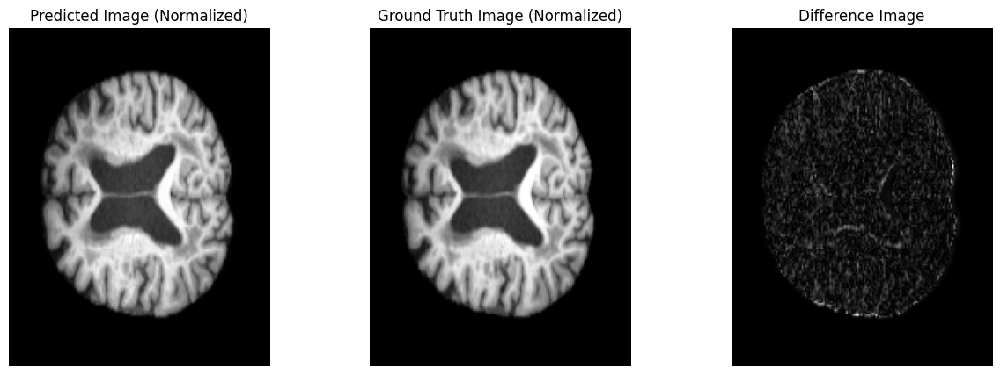

$$$$$$$$$$$$$$$$ Target age: 79.0
Age difference:  1.0
Diagnostic category: CN
Checking dimensions
pred torch.Size([1, 1, 208, 160])
gt: torch.Size([1, 1, 208, 160])
Checking intensity range
pred min: 0.0 pred max: 1.0
gt min: 0.0 gt max: 1.0
diff min: 0.0 gt max: 0.27974438667297363
pred var: tensor(0.0963, device='cuda:0')
gt var: tensor(0.0955, device='cuda:0')
MSE: 0.0007546964916400611
SSIM: 0.9410371780395508
--------


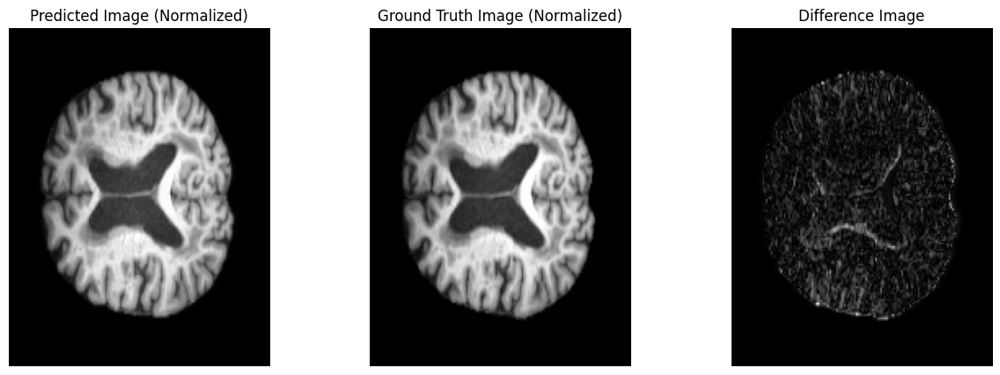

Checking dimensions
pred torch.Size([1, 1, 208, 160])
gt: torch.Size([1, 1, 208, 160])
Checking intensity range
pred min: 0.0 pred max: 1.0
gt min: 0.0 gt max: 1.0
diff min: 0.0 gt max: 0.27544230222702026
pred var: tensor(0.0958, device='cuda:0')
gt var: tensor(0.0945, device='cuda:0')
MSE: 0.0007465949165634811
SSIM: 0.950279951095581
--------


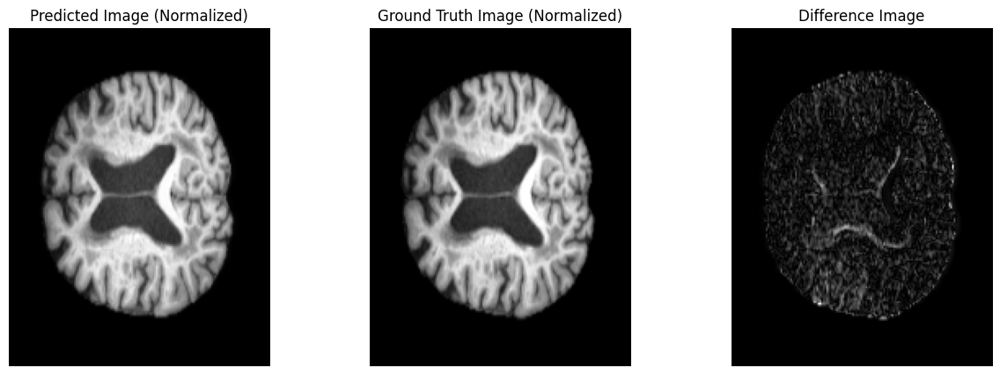

$$$$$$$$$$$$$$$$ Target age: 81.0
Age difference:  3.0
Diagnostic category: CN
Checking dimensions
pred torch.Size([1, 1, 208, 160])
gt: torch.Size([1, 1, 208, 160])
Checking intensity range
pred min: 0.0 pred max: 1.0
gt min: 0.0 gt max: 1.0
diff min: 0.0 gt max: 0.37943726778030396
pred var: tensor(0.0963, device='cuda:0')
gt var: tensor(0.0990, device='cuda:0')
MSE: 0.001173457596451044
SSIM: 0.9277073740959167
--------


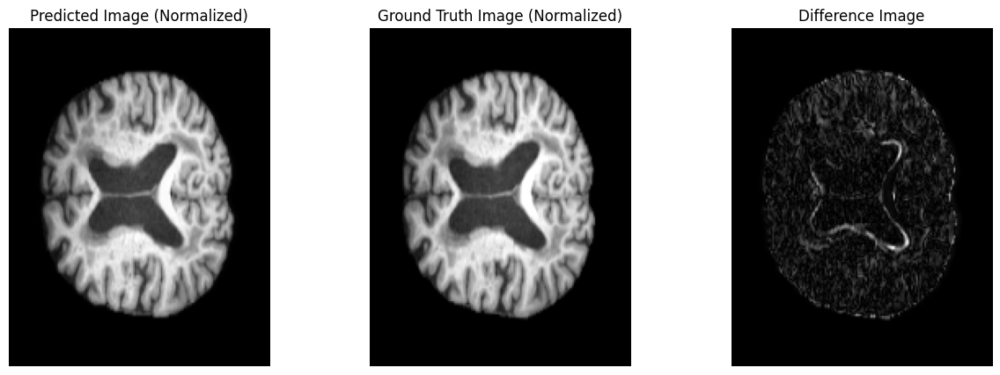

Checking dimensions
pred torch.Size([1, 1, 208, 160])
gt: torch.Size([1, 1, 208, 160])
Checking intensity range
pred min: 0.0 pred max: 1.0
gt min: 0.0 gt max: 1.0
diff min: 0.0 gt max: 0.3943944573402405
pred var: tensor(0.0958, device='cuda:0')
gt var: tensor(0.0977, device='cuda:0')
MSE: 0.0011383702512830496
SSIM: 0.9362303018569946
--------


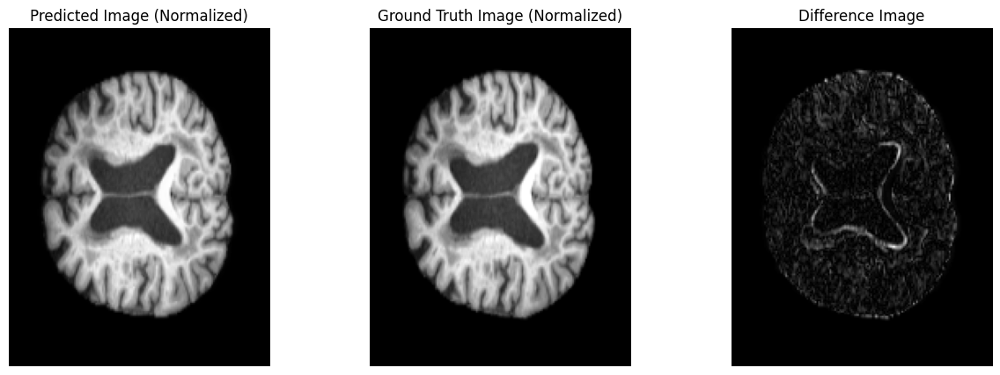

$$$$$$$$$$$$$$$$ Target age: 83.0
Age difference:  5.0
Diagnostic category: MCI
Checking dimensions
pred torch.Size([1, 1, 208, 160])
gt: torch.Size([1, 1, 208, 160])
Checking intensity range
pred min: 0.0 pred max: 1.0
gt min: 0.0 gt max: 1.0
diff min: 0.0 gt max: 0.5206841230392456
pred var: tensor(0.0963, device='cuda:0')
gt var: tensor(0.0923, device='cuda:0')
MSE: 0.003002126468345523
SSIM: 0.9135993719100952
--------


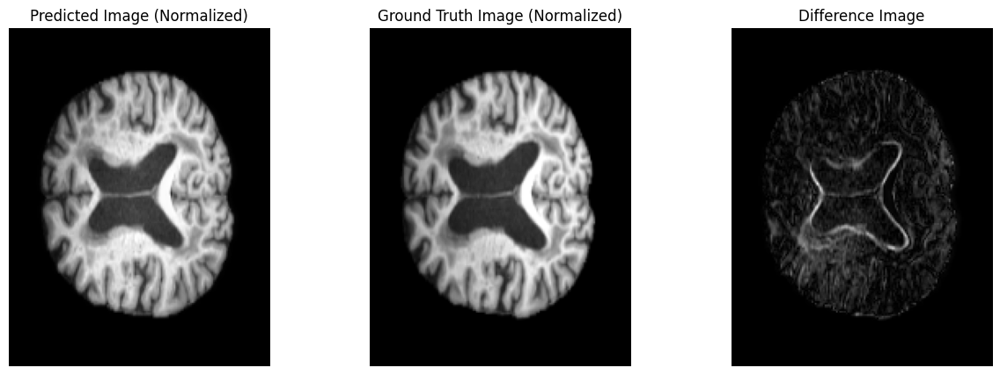

Checking dimensions
pred torch.Size([1, 1, 208, 160])
gt: torch.Size([1, 1, 208, 160])
Checking intensity range
pred min: 0.0 pred max: 1.0
gt min: 0.0 gt max: 1.0
diff min: 0.0 gt max: 0.47777000069618225
pred var: tensor(0.0958, device='cuda:0')
gt var: tensor(0.0910, device='cuda:0')
MSE: 0.0029618858825415373
SSIM: 0.9232919812202454
--------


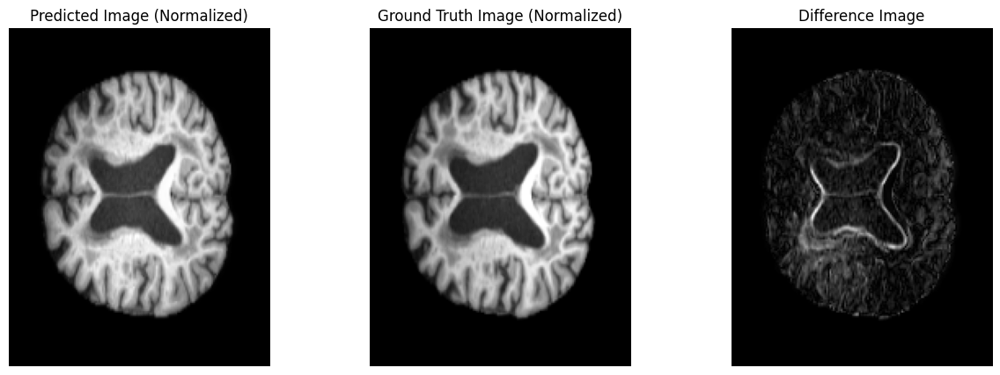

$$$$$$$$$$$$$$$$ Target age: 86.0
Age difference:  8.0
Diagnostic category: MCI
Checking dimensions
pred torch.Size([1, 1, 208, 160])
gt: torch.Size([1, 1, 208, 160])
Checking intensity range
pred min: 0.0 pred max: 1.0
gt min: 0.0 gt max: 1.0
diff min: 0.0 gt max: 0.6100871562957764
pred var: tensor(0.0963, device='cuda:0')
gt var: tensor(0.1063, device='cuda:0')
MSE: 0.004367449786514044
SSIM: 0.8731249570846558
--------


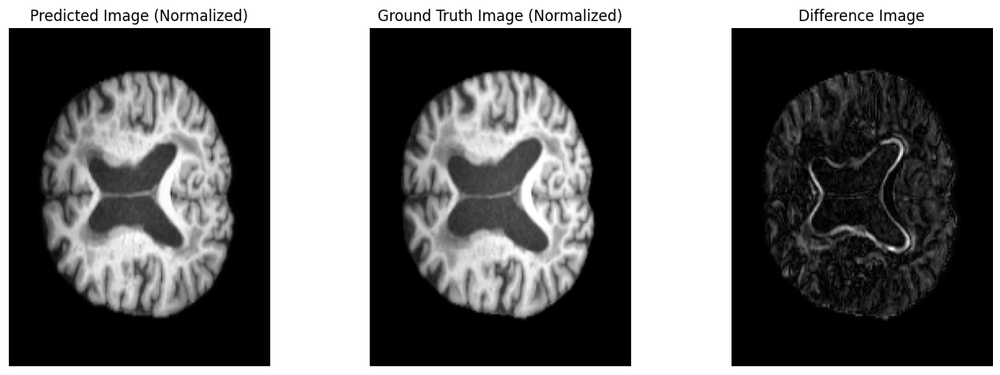

Checking dimensions
pred torch.Size([1, 1, 208, 160])
gt: torch.Size([1, 1, 208, 160])
Checking intensity range
pred min: 0.0 pred max: 1.0
gt min: 0.0 gt max: 1.0
diff min: 0.0 gt max: 0.615251898765564
pred var: tensor(0.0958, device='cuda:0')
gt var: tensor(0.1055, device='cuda:0')
MSE: 0.004178314935415983
SSIM: 0.8836029171943665
--------


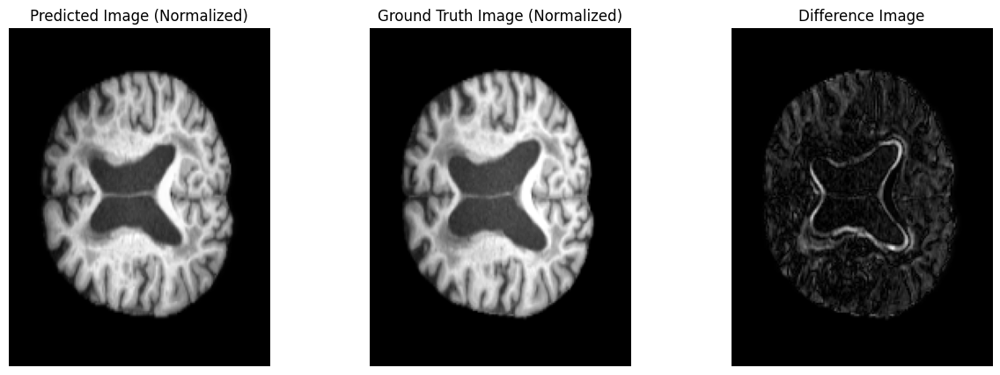

$$$$$$$$$$$$$$$$ Target age: 62.0
Age difference:  0.0
Diagnostic category: MCI
$$$$$$$$$$$$$$$$ Target age: 64.0
Age difference:  2.0
Diagnostic category: AD
Checking dimensions
pred torch.Size([1, 1, 208, 160])
gt: torch.Size([1, 1, 208, 160])
Checking intensity range
pred min: 0.0 pred max: 1.0
gt min: 0.0 gt max: 1.0
diff min: 3.2782554626464844e-06 gt max: 0.38695597648620605
pred var: tensor(0.1315, device='cuda:0')
gt var: tensor(0.1302, device='cuda:0')
MSE: 0.001532405847683549
SSIM: 0.9240500330924988
--------


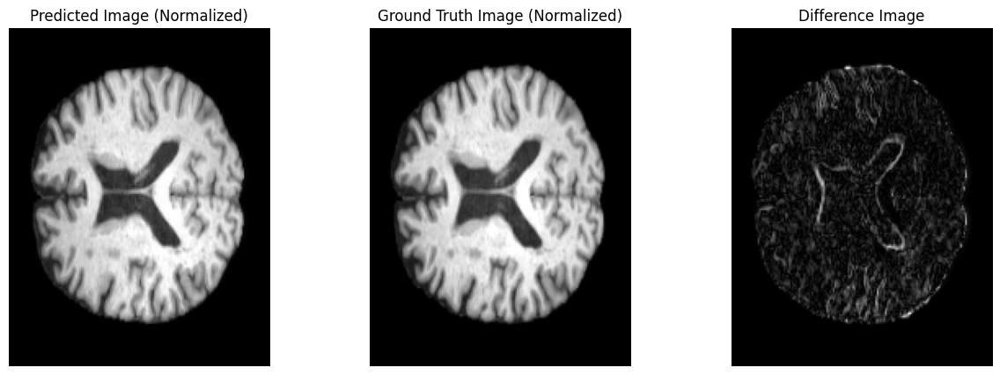

Checking dimensions
pred torch.Size([1, 1, 208, 160])
gt: torch.Size([1, 1, 208, 160])
Checking intensity range
pred min: 0.0 pred max: 1.0
gt min: 0.0 gt max: 1.0
diff min: 0.0 gt max: 0.37342631816864014
pred var: tensor(0.1302, device='cuda:0')
gt var: tensor(0.1297, device='cuda:0')
MSE: 0.0015222037909552455
SSIM: 0.9147495627403259
--------


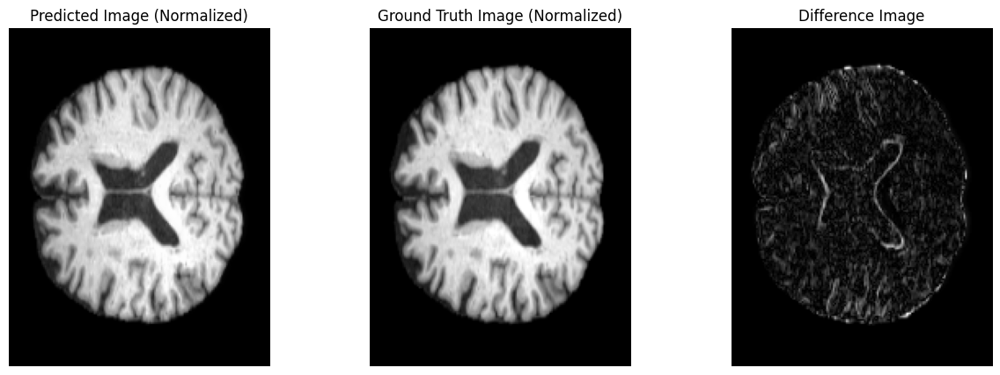

$$$$$$$$$$$$$$$$ Target age: 68.0
Age difference:  0.0
Diagnostic category: CN
$$$$$$$$$$$$$$$$ Target age: 69.0
Age difference:  1.0
Diagnostic category: CN
Checking dimensions
pred torch.Size([1, 1, 208, 160])
gt: torch.Size([1, 1, 208, 160])
Checking intensity range
pred min: 0.0 pred max: 1.0
gt min: 0.0 gt max: 1.0
diff min: 0.0 gt max: 0.3306403160095215
pred var: tensor(0.1209, device='cuda:0')
gt var: tensor(0.1258, device='cuda:0')
MSE: 0.0006518983864225447
SSIM: 0.9585264921188354
--------


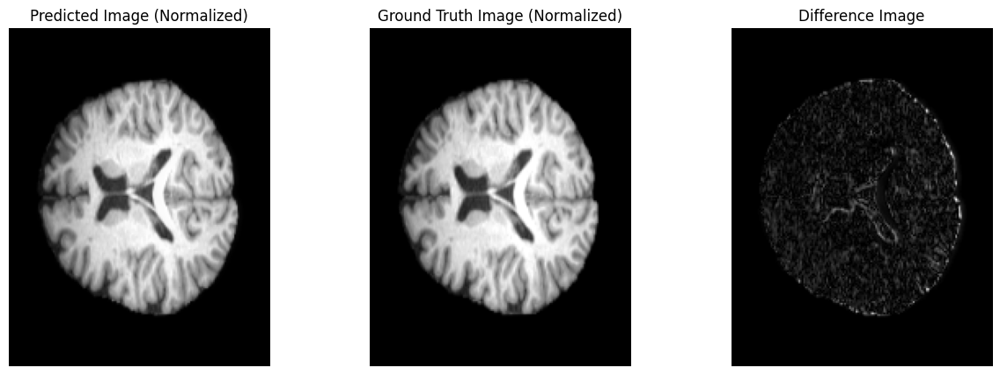

Checking dimensions
pred torch.Size([1, 1, 208, 160])
gt: torch.Size([1, 1, 208, 160])
Checking intensity range
pred min: 0.0 pred max: 1.0
gt min: 0.0 gt max: 1.0
diff min: 2.175569534301758e-06 gt max: 0.3266426622867584
pred var: tensor(0.1198, device='cuda:0')
gt var: tensor(0.1251, device='cuda:0')
MSE: 0.0006873976672068238
SSIM: 0.941785454750061
--------


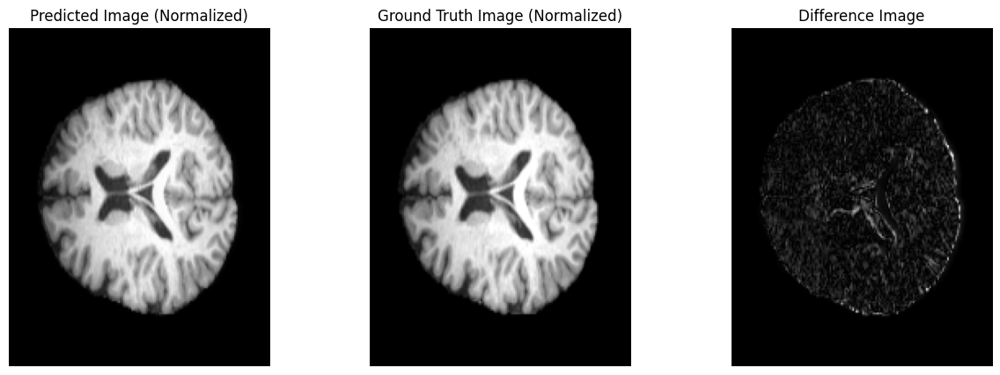

$$$$$$$$$$$$$$$$ Target age: 69.0
Age difference:  1.0
Diagnostic category: CN
Checking dimensions
pred torch.Size([1, 1, 208, 160])
gt: torch.Size([1, 1, 208, 160])
Checking intensity range
pred min: 0.0 pred max: 1.0
gt min: 0.0 gt max: 1.0
diff min: 0.0 gt max: 0.2663933336734772
pred var: tensor(0.1209, device='cuda:0')
gt var: tensor(0.1217, device='cuda:0')
MSE: 0.0006698042270727456
SSIM: 0.9587385058403015
--------


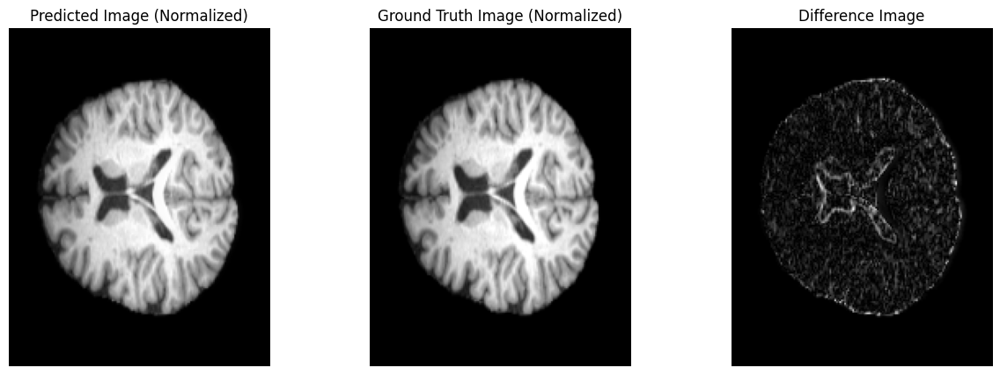

Checking dimensions
pred torch.Size([1, 1, 208, 160])
gt: torch.Size([1, 1, 208, 160])
Checking intensity range
pred min: 0.0 pred max: 1.0
gt min: 0.0 gt max: 1.0
diff min: 0.0 gt max: 0.3105044364929199
pred var: tensor(0.1198, device='cuda:0')
gt var: tensor(0.1207, device='cuda:0')
MSE: 0.0007135755731724203
SSIM: 0.9415846467018127
--------


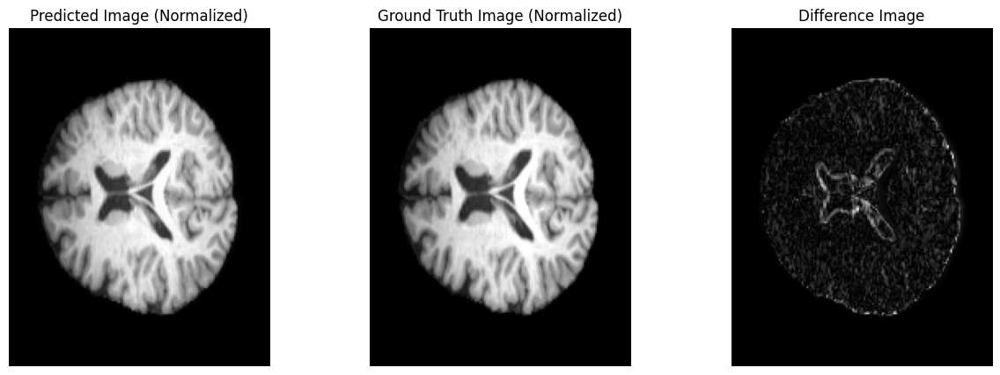

$$$$$$$$$$$$$$$$ Target age: 70.0
Age difference:  2.0
Diagnostic category: CN
Checking dimensions
pred torch.Size([1, 1, 208, 160])
gt: torch.Size([1, 1, 208, 160])
Checking intensity range
pred min: 0.0 pred max: 1.0
gt min: 0.0 gt max: 1.0
diff min: 0.0 gt max: 0.34033986926078796
pred var: tensor(0.1209, device='cuda:0')
gt var: tensor(0.1212, device='cuda:0')
MSE: 0.0005624385084956884
SSIM: 0.9589123725891113
--------


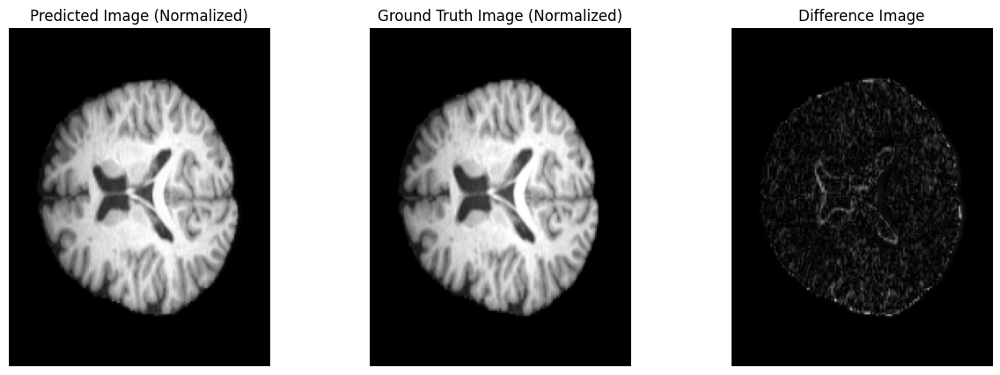

Checking dimensions
pred torch.Size([1, 1, 208, 160])
gt: torch.Size([1, 1, 208, 160])
Checking intensity range
pred min: 0.0 pred max: 1.0
gt min: 0.0 gt max: 1.0
diff min: 0.0 gt max: 0.27704286575317383
pred var: tensor(0.1198, device='cuda:0')
gt var: tensor(0.1199, device='cuda:0')
MSE: 0.0005642772885039449
SSIM: 0.9431157112121582
--------


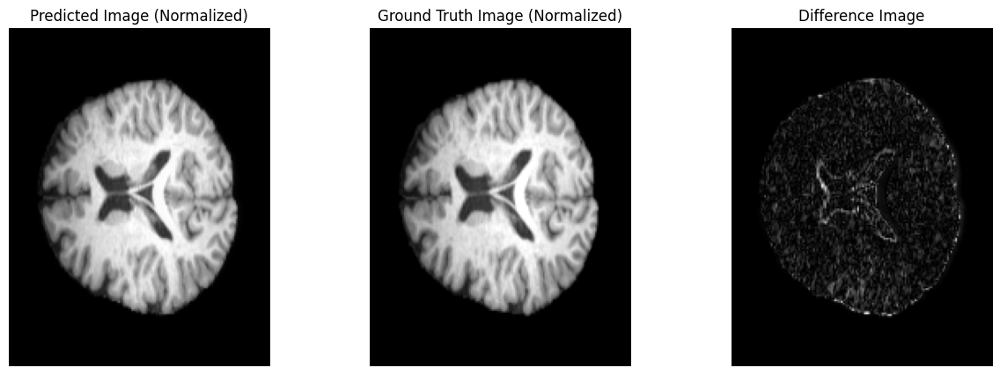

$$$$$$$$$$$$$$$$ Target age: 72.0
Age difference:  4.0
Diagnostic category: MCI
Checking dimensions
pred torch.Size([1, 1, 208, 160])
gt: torch.Size([1, 1, 208, 160])
Checking intensity range
pred min: 0.0 pred max: 1.0
gt min: 0.0 gt max: 1.0
diff min: 0.0 gt max: 0.34167492389678955
pred var: tensor(0.1209, device='cuda:0')
gt var: tensor(0.1179, device='cuda:0')
MSE: 0.0008324105874635279
SSIM: 0.9497274160385132
--------


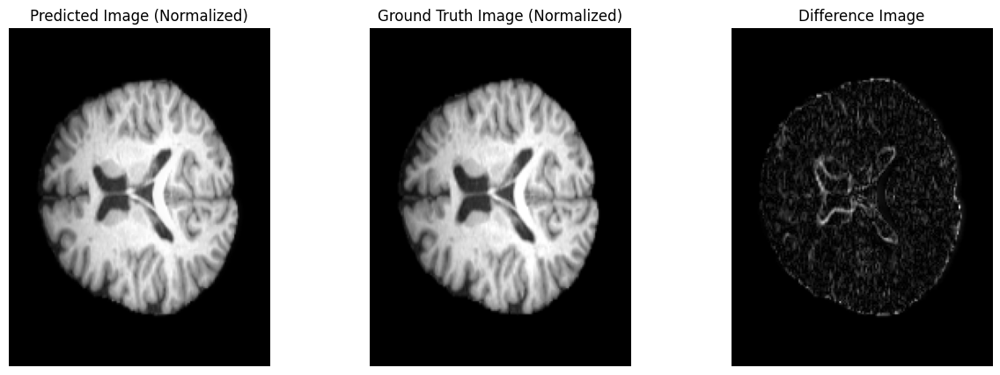

Checking dimensions
pred torch.Size([1, 1, 208, 160])
gt: torch.Size([1, 1, 208, 160])
Checking intensity range
pred min: 0.0 pred max: 1.0
gt min: 0.0 gt max: 1.0
diff min: 0.0 gt max: 0.31828269362449646
pred var: tensor(0.1198, device='cuda:0')
gt var: tensor(0.1169, device='cuda:0')
MSE: 0.0008386402623727918
SSIM: 0.9361600875854492
--------


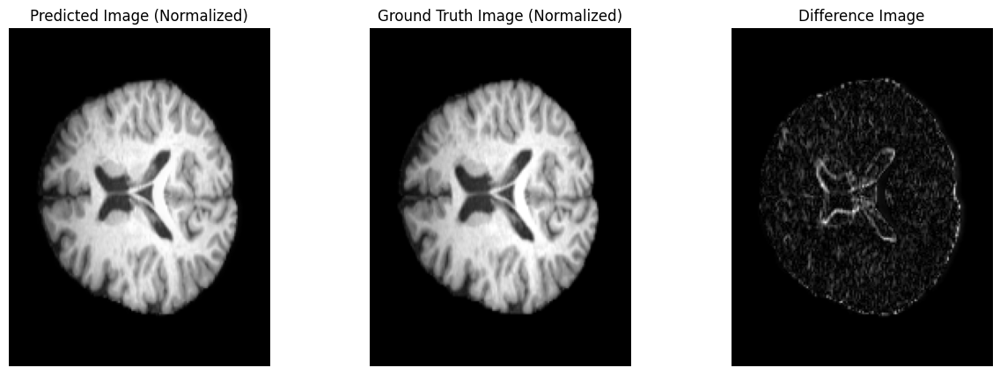

$$$$$$$$$$$$$$$$ Target age: 83.0
Age difference:  0.0
Diagnostic category: CN
$$$$$$$$$$$$$$$$ Target age: 84.0
Age difference:  1.0
Diagnostic category: CN
Checking dimensions
pred torch.Size([1, 1, 208, 160])
gt: torch.Size([1, 1, 208, 160])
Checking intensity range
pred min: 0.0 pred max: 1.0
gt min: 0.0 gt max: 1.0
diff min: 0.0 gt max: 0.2645169198513031
pred var: tensor(0.1115, device='cuda:0')
gt var: tensor(0.1132, device='cuda:0')
MSE: 0.0004729339270852506
SSIM: 0.9655792117118835
--------


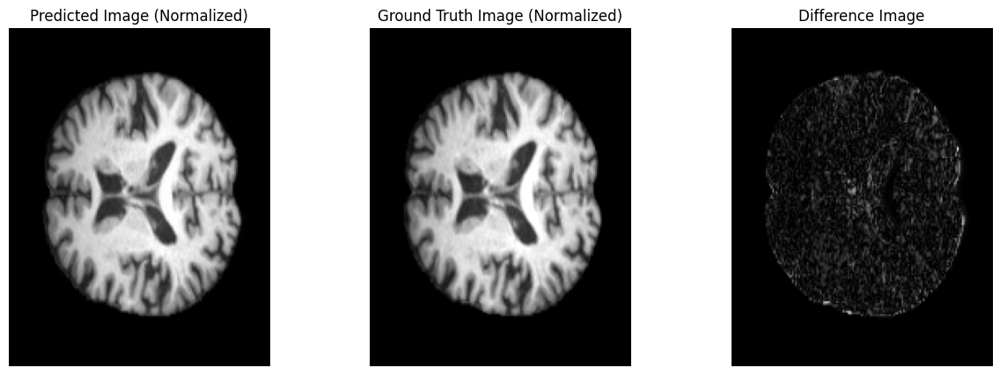

Checking dimensions
pred torch.Size([1, 1, 208, 160])
gt: torch.Size([1, 1, 208, 160])
Checking intensity range
pred min: 0.0 pred max: 1.0
gt min: 0.0 gt max: 1.0
diff min: 0.0 gt max: 0.23078322410583496
pred var: tensor(0.1099, device='cuda:0')
gt var: tensor(0.1117, device='cuda:0')
MSE: 0.00046399098937399685
SSIM: 0.9628860950469971
--------


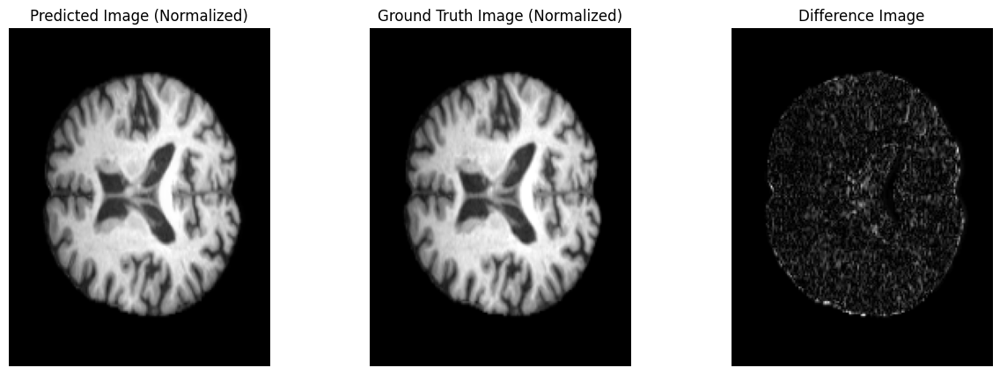

$$$$$$$$$$$$$$$$ Target age: 84.0
Age difference:  1.0
Diagnostic category: CN
Checking dimensions
pred torch.Size([1, 1, 208, 160])
gt: torch.Size([1, 1, 208, 160])
Checking intensity range
pred min: 0.0 pred max: 1.0
gt min: 0.0 gt max: 1.0
diff min: 0.0 gt max: 0.22639429569244385
pred var: tensor(0.1115, device='cuda:0')
gt var: tensor(0.1122, device='cuda:0')
MSE: 0.0004368404333945364
SSIM: 0.966763436794281
--------


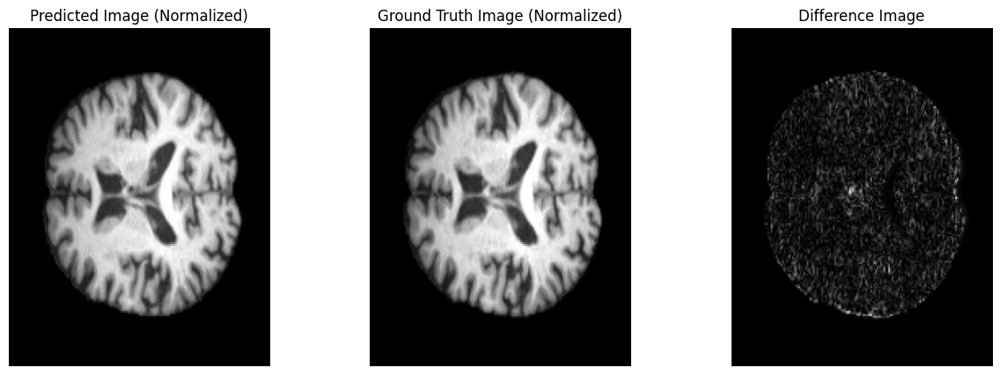

Checking dimensions
pred torch.Size([1, 1, 208, 160])
gt: torch.Size([1, 1, 208, 160])
Checking intensity range
pred min: 0.0 pred max: 1.0
gt min: 0.0 gt max: 1.0
diff min: 0.0 gt max: 0.22993037104606628
pred var: tensor(0.1099, device='cuda:0')
gt var: tensor(0.1105, device='cuda:0')
MSE: 0.00043801162973977625
SSIM: 0.9638198018074036
--------


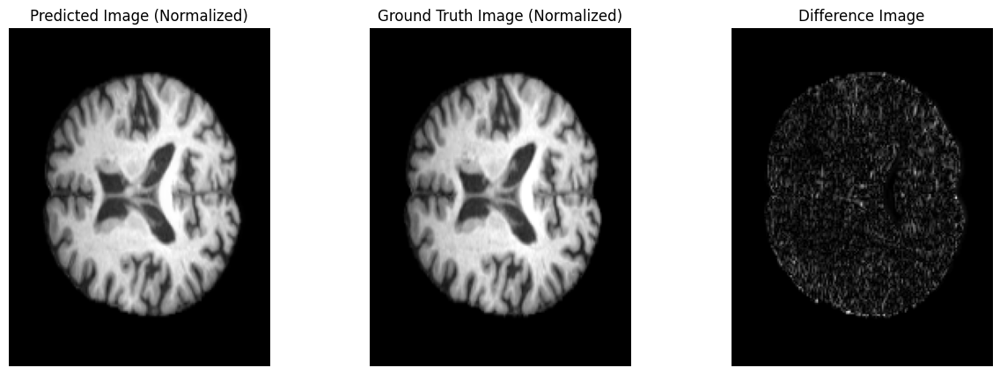

$$$$$$$$$$$$$$$$ Target age: 85.0
Age difference:  2.0
Diagnostic category: MCI
Checking dimensions
pred torch.Size([1, 1, 208, 160])
gt: torch.Size([1, 1, 208, 160])
Checking intensity range
pred min: 0.0 pred max: 1.0
gt min: 0.0 gt max: 1.0
diff min: 0.0 gt max: 0.3089577555656433
pred var: tensor(0.1115, device='cuda:0')
gt var: tensor(0.1096, device='cuda:0')
MSE: 0.0007206981536000967
SSIM: 0.9588874578475952
--------


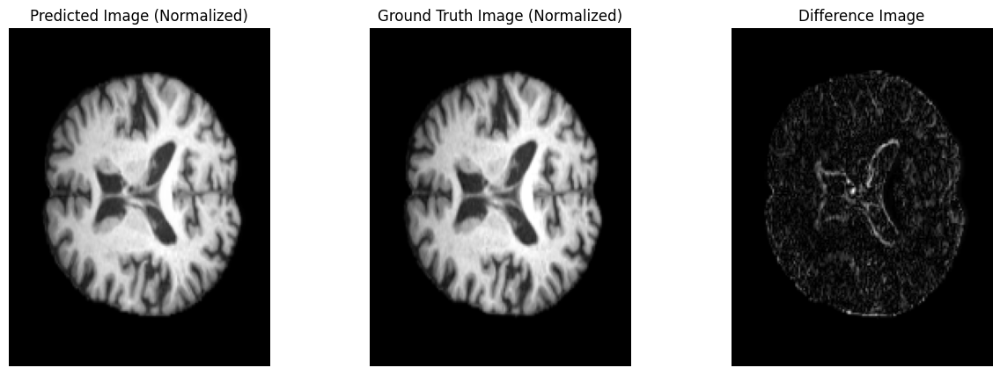

Checking dimensions
pred torch.Size([1, 1, 208, 160])
gt: torch.Size([1, 1, 208, 160])
Checking intensity range
pred min: 0.0 pred max: 1.0
gt min: 0.0 gt max: 1.0
diff min: 0.0 gt max: 0.25627243518829346
pred var: tensor(0.1099, device='cuda:0')
gt var: tensor(0.1083, device='cuda:0')
MSE: 0.0007064082892611623
SSIM: 0.9565625786781311
--------


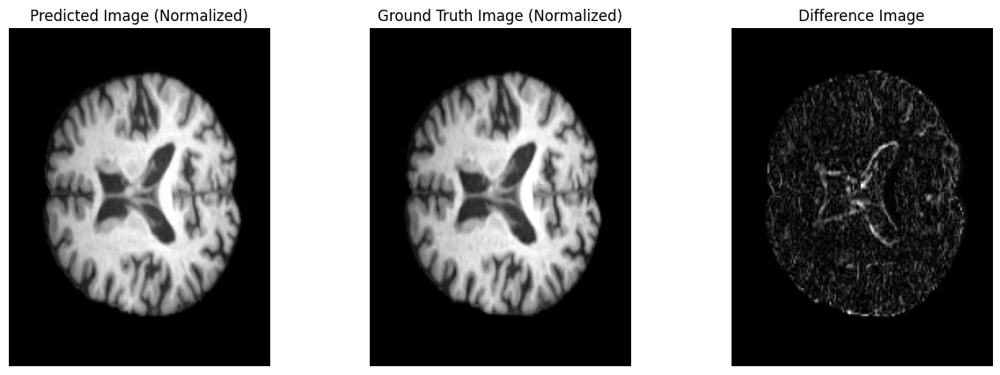

$$$$$$$$$$$$$$$$ Target age: 70.0
Age difference:  0.0
Diagnostic category: MCI
$$$$$$$$$$$$$$$$ Target age: 70.0
Age difference:  0.0
Diagnostic category: AD
$$$$$$$$$$$$$$$$ Target age: 71.0
Age difference:  1.0
Diagnostic category: AD
Checking dimensions
pred torch.Size([1, 1, 208, 160])
gt: torch.Size([1, 1, 208, 160])
Checking intensity range
pred min: 0.0 pred max: 1.0
gt min: 0.0 gt max: 1.0
diff min: 0.0 gt max: 0.4854995608329773
pred var: tensor(0.1139, device='cuda:0')
gt var: tensor(0.1145, device='cuda:0')
MSE: 0.0016422384651377797
SSIM: 0.9344151020050049
--------


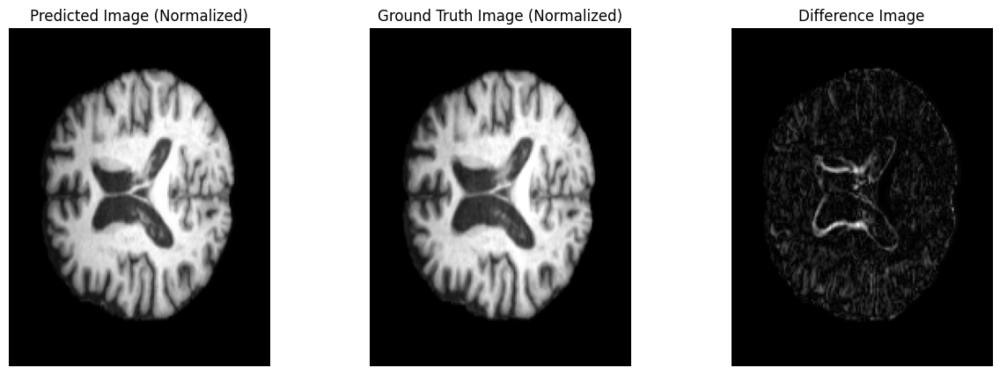

Checking dimensions
pred torch.Size([1, 1, 208, 160])
gt: torch.Size([1, 1, 208, 160])
Checking intensity range
pred min: 0.0 pred max: 1.0
gt min: 0.0 gt max: 1.0
diff min: 0.0 gt max: 0.4143584966659546
pred var: tensor(0.1142, device='cuda:0')
gt var: tensor(0.1147, device='cuda:0')
MSE: 0.0014792099827900529
SSIM: 0.936082661151886
--------


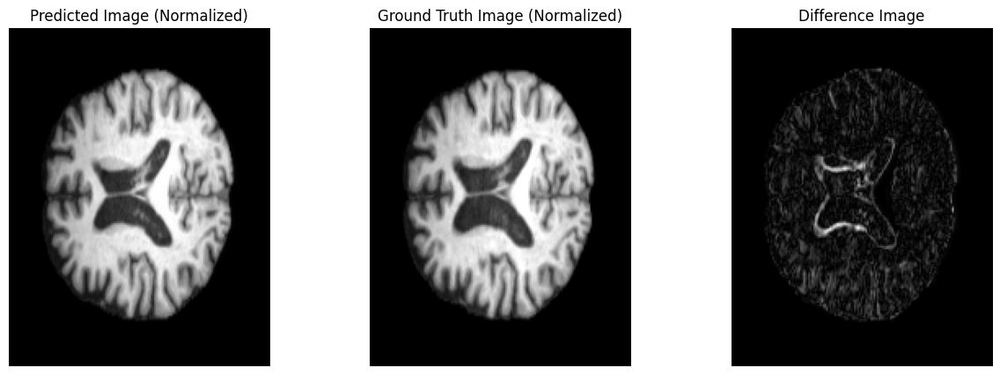

$$$$$$$$$$$$$$$$ Target age: 72.0
Age difference:  2.0
Diagnostic category: AD
Checking dimensions
pred torch.Size([1, 1, 208, 160])
gt: torch.Size([1, 1, 208, 160])
Checking intensity range
pred min: 0.0 pred max: 1.0
gt min: 0.0 gt max: 1.0
diff min: 0.0 gt max: 0.7653101682662964
pred var: tensor(0.1139, device='cuda:0')
gt var: tensor(0.1062, device='cuda:0')
MSE: 0.00730247562751174
SSIM: 0.8566736578941345
--------


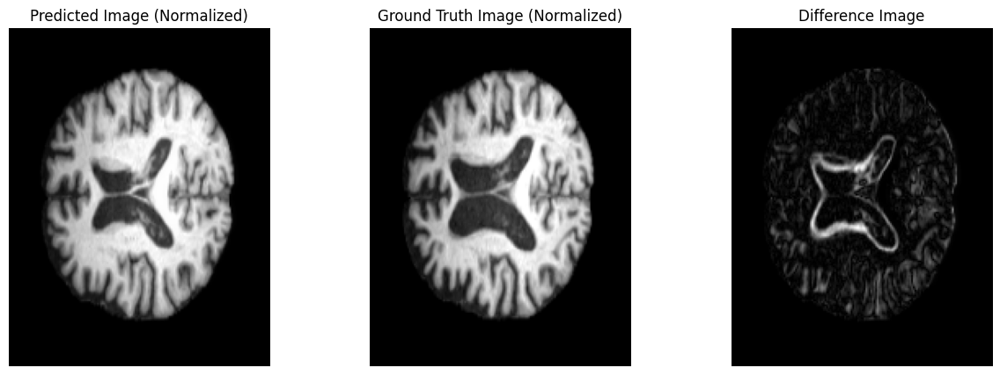

Checking dimensions
pred torch.Size([1, 1, 208, 160])
gt: torch.Size([1, 1, 208, 160])
Checking intensity range
pred min: 0.0 pred max: 1.0
gt min: 0.0 gt max: 1.0
diff min: 0.0 gt max: 0.6899353265762329
pred var: tensor(0.1142, device='cuda:0')
gt var: tensor(0.1066, device='cuda:0')
MSE: 0.0066523137502372265
SSIM: 0.8594701886177063
--------


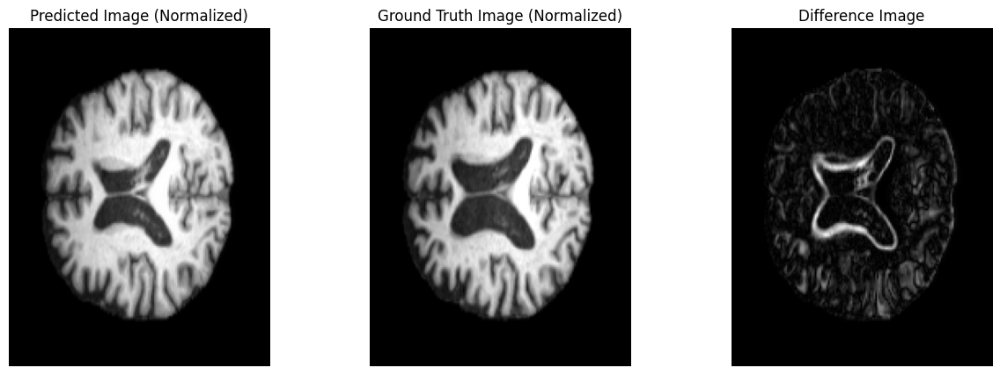

$$$$$$$$$$$$$$$$ Target age: 56.0
Age difference:  0.0
Diagnostic category: MCI
$$$$$$$$$$$$$$$$ Target age: 57.0
Age difference:  1.0
Diagnostic category: MCI
Checking dimensions
pred torch.Size([1, 1, 208, 160])
gt: torch.Size([1, 1, 208, 160])
Checking intensity range
pred min: 0.0 pred max: 1.0
gt min: 0.0 gt max: 1.0
diff min: 0.0 gt max: 0.2913980185985565
pred var: tensor(0.1225, device='cuda:0')
gt var: tensor(0.1232, device='cuda:0')
MSE: 0.0012490007793530822
SSIM: 0.9554451704025269
--------


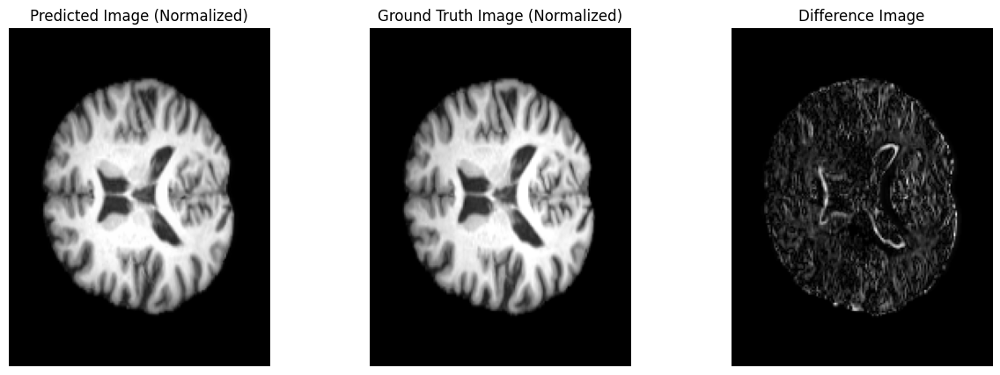

Checking dimensions
pred torch.Size([1, 1, 208, 160])
gt: torch.Size([1, 1, 208, 160])
Checking intensity range
pred min: 0.0 pred max: 1.0
gt min: 0.0 gt max: 1.0
diff min: 0.0 gt max: 0.32571297883987427
pred var: tensor(0.1211, device='cuda:0')
gt var: tensor(0.1211, device='cuda:0')
MSE: 0.0013376574497669935
SSIM: 0.9528033137321472
--------


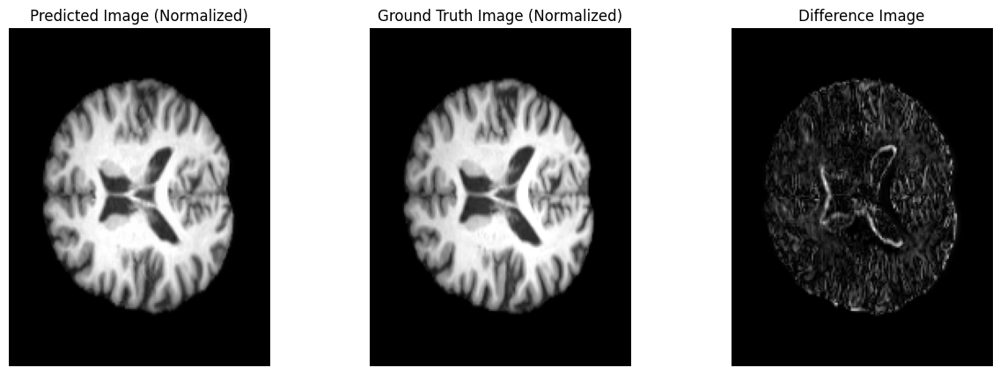

$$$$$$$$$$$$$$$$ Target age: 59.0
Age difference:  3.0
Diagnostic category: AD
Checking dimensions
pred torch.Size([1, 1, 208, 160])
gt: torch.Size([1, 1, 208, 160])
Checking intensity range
pred min: 0.0 pred max: 1.0
gt min: 0.0 gt max: 1.0
diff min: 0.0 gt max: 0.6580359935760498
pred var: tensor(0.1225, device='cuda:0')
gt var: tensor(0.1198, device='cuda:0')
MSE: 0.005170184187591076
SSIM: 0.8966867923736572
--------


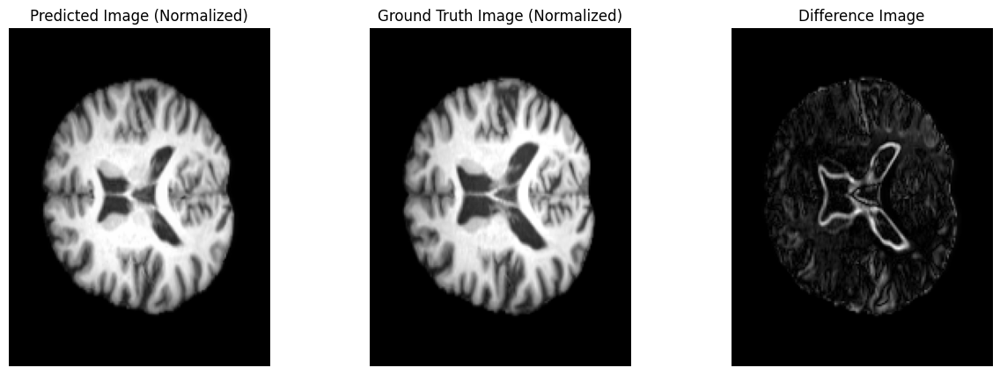

Checking dimensions
pred torch.Size([1, 1, 208, 160])
gt: torch.Size([1, 1, 208, 160])
Checking intensity range
pred min: 0.0 pred max: 1.0
gt min: 0.0 gt max: 1.0
diff min: 0.0 gt max: 0.6410976052284241
pred var: tensor(0.1211, device='cuda:0')
gt var: tensor(0.1182, device='cuda:0')
MSE: 0.005384776741266251
SSIM: 0.8973265290260315
--------


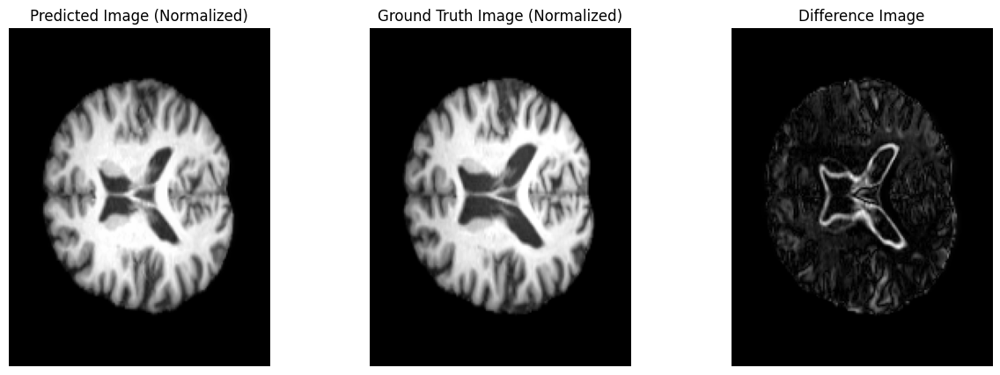

$$$$$$$$$$$$$$$$ Target age: 61.0
Age difference:  5.0
Diagnostic category: AD
Checking dimensions
pred torch.Size([1, 1, 208, 160])
gt: torch.Size([1, 1, 208, 160])
Checking intensity range
pred min: 0.0 pred max: 1.0
gt min: 0.0 gt max: 1.0
diff min: 0.0 gt max: 0.82085120677948
pred var: tensor(0.1225, device='cuda:0')
gt var: tensor(0.1102, device='cuda:0')
MSE: 0.016758279874920845
SSIM: 0.7974732518196106
--------


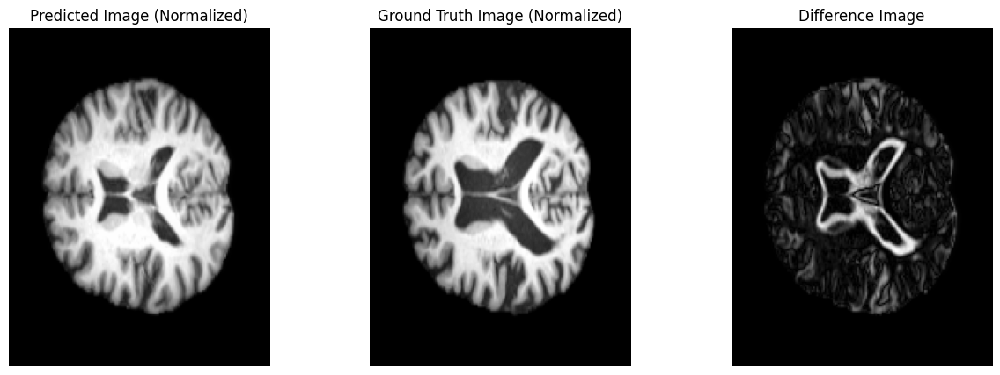

Checking dimensions
pred torch.Size([1, 1, 208, 160])
gt: torch.Size([1, 1, 208, 160])
Checking intensity range
pred min: 0.0 pred max: 1.0
gt min: 0.0 gt max: 1.0
diff min: 0.0 gt max: 0.8110665082931519
pred var: tensor(0.1211, device='cuda:0')
gt var: tensor(0.1092, device='cuda:0')
MSE: 0.01617295853793621
SSIM: 0.80817049741745
--------


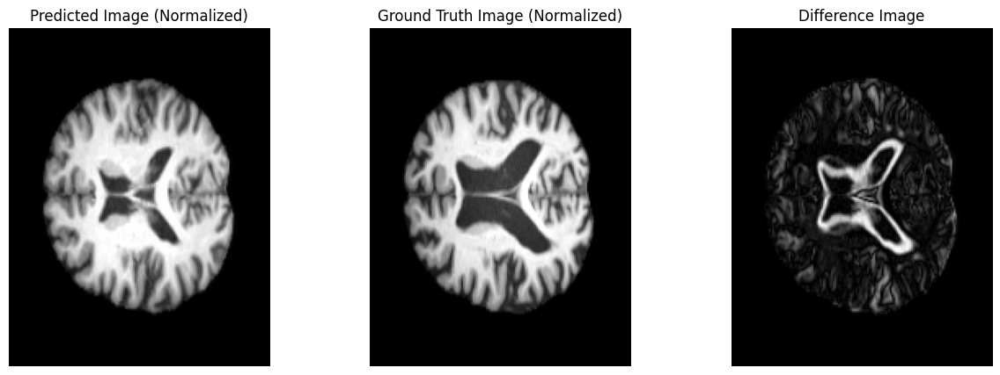

$$$$$$$$$$$$$$$$ Target age: 74.0
Age difference:  0.0
Diagnostic category: MCI
$$$$$$$$$$$$$$$$ Target age: 75.0
Age difference:  1.0
Diagnostic category: MCI
Checking dimensions
pred torch.Size([1, 1, 208, 160])
gt: torch.Size([1, 1, 208, 160])
Checking intensity range
pred min: 0.0 pred max: 1.0
gt min: 0.0 gt max: 1.0
diff min: 0.0 gt max: 0.31570595502853394
pred var: tensor(0.1244, device='cuda:0')
gt var: tensor(0.1267, device='cuda:0')
MSE: 0.0006879942957311869
SSIM: 0.912089467048645
--------


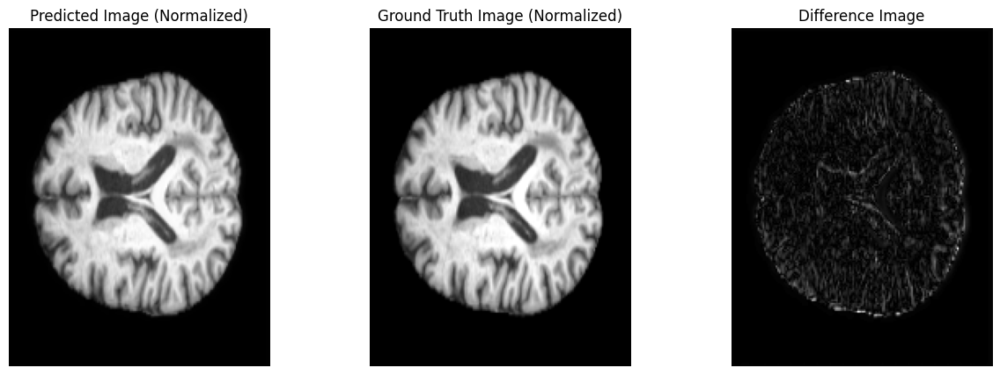

Checking dimensions
pred torch.Size([1, 1, 208, 160])
gt: torch.Size([1, 1, 208, 160])
Checking intensity range
pred min: 0.0 pred max: 1.0
gt min: 0.0 gt max: 1.0
diff min: 0.0 gt max: 0.3073999285697937
pred var: tensor(0.1243, device='cuda:0')
gt var: tensor(0.1253, device='cuda:0')
MSE: 0.0006589685217477381
SSIM: 0.9469556212425232
--------


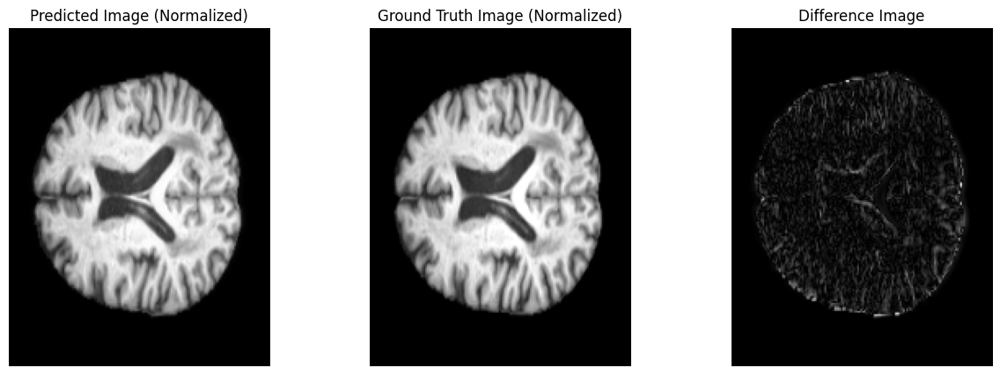

$$$$$$$$$$$$$$$$ Target age: 75.0
Age difference:  1.0
Diagnostic category: MCI
Checking dimensions
pred torch.Size([1, 1, 208, 160])
gt: torch.Size([1, 1, 208, 160])
Checking intensity range
pred min: 0.0 pred max: 1.0
gt min: 0.0 gt max: 1.0
diff min: 0.0 gt max: 0.29550689458847046
pred var: tensor(0.1244, device='cuda:0')
gt var: tensor(0.1231, device='cuda:0')
MSE: 0.001036560395732522
SSIM: 0.9033325910568237
--------


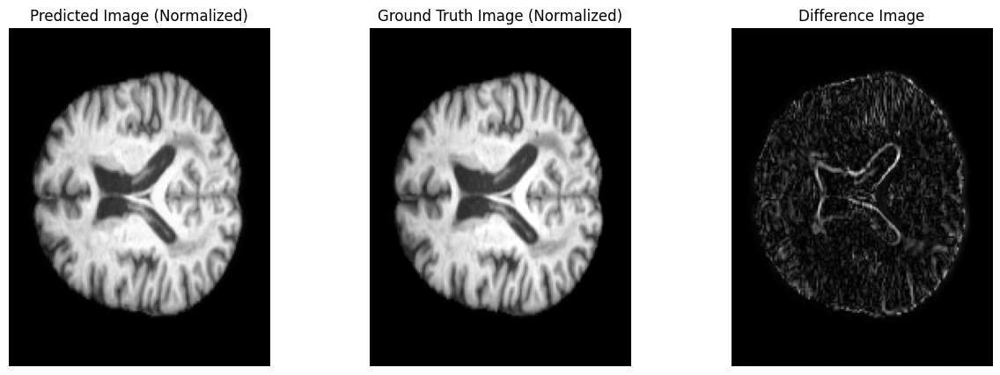

Checking dimensions
pred torch.Size([1, 1, 208, 160])
gt: torch.Size([1, 1, 208, 160])
Checking intensity range
pred min: 0.0 pred max: 1.0
gt min: 0.0 gt max: 1.0
diff min: 0.0 gt max: 0.2932572066783905
pred var: tensor(0.1243, device='cuda:0')
gt var: tensor(0.1217, device='cuda:0')
MSE: 0.0010610786266624928
SSIM: 0.9360746145248413
--------


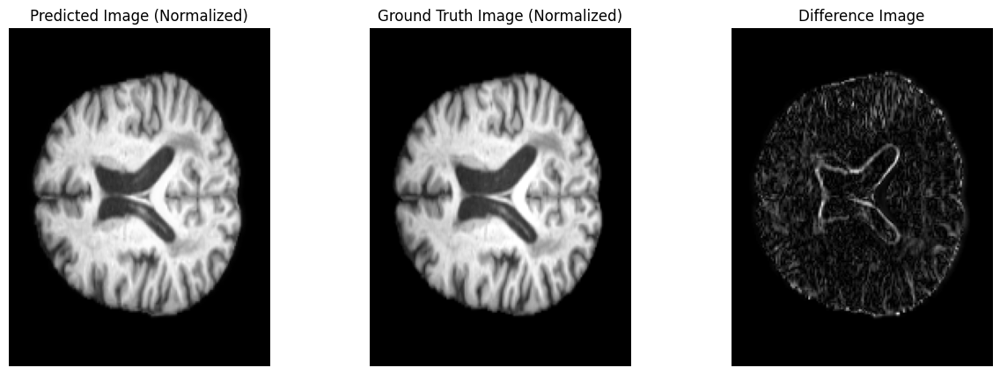

$$$$$$$$$$$$$$$$ Target age: 76.0
Age difference:  2.0
Diagnostic category: AD
Checking dimensions
pred torch.Size([1, 1, 208, 160])
gt: torch.Size([1, 1, 208, 160])
Checking intensity range
pred min: 0.0 pred max: 1.0
gt min: 0.0 gt max: 1.0
diff min: 0.0 gt max: 0.6407495141029358
pred var: tensor(0.1244, device='cuda:0')
gt var: tensor(0.1199, device='cuda:0')
MSE: 0.0029276921413838863
SSIM: 0.8608317375183105
--------


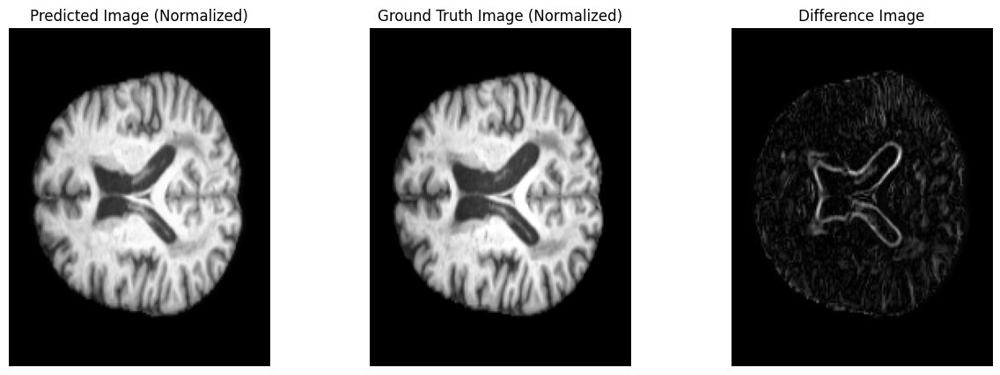

Checking dimensions
pred torch.Size([1, 1, 208, 160])
gt: torch.Size([1, 1, 208, 160])
Checking intensity range
pred min: 0.0 pred max: 1.0
gt min: 0.0 gt max: 1.0
diff min: 0.0 gt max: 0.5861133337020874
pred var: tensor(0.1243, device='cuda:0')
gt var: tensor(0.1186, device='cuda:0')
MSE: 0.002890564501285553
SSIM: 0.8950703740119934
--------


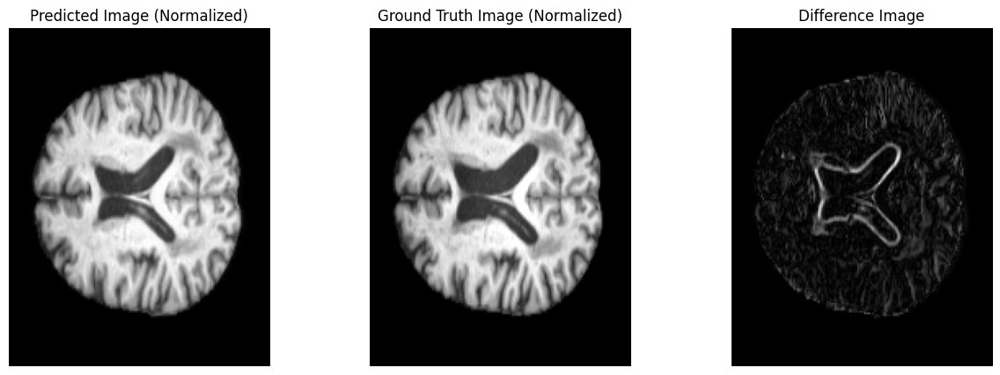

$$$$$$$$$$$$$$$$ Target age: 78.0
Age difference:  4.0
Diagnostic category: AD
Checking dimensions
pred torch.Size([1, 1, 208, 160])
gt: torch.Size([1, 1, 208, 160])
Checking intensity range
pred min: 0.0 pred max: 1.0
gt min: 0.0 gt max: 1.0
diff min: 0.0 gt max: 0.7631784677505493
pred var: tensor(0.1244, device='cuda:0')
gt var: tensor(0.1133, device='cuda:0')
MSE: 0.007074947468936443
SSIM: 0.8095574975013733
--------


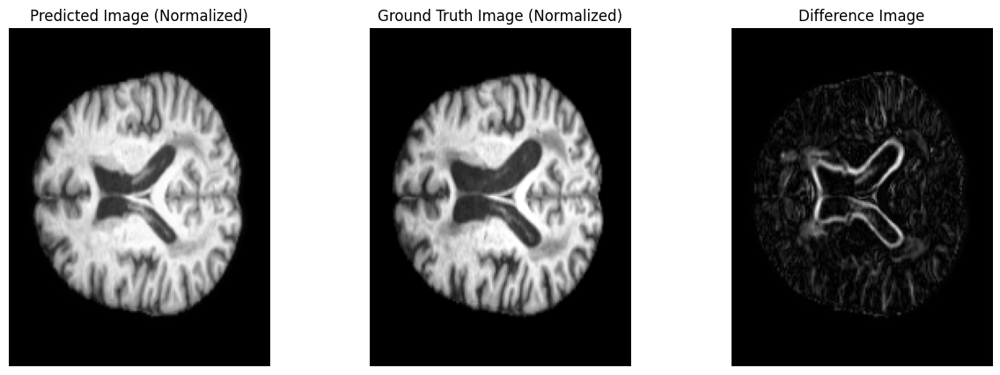

Checking dimensions
pred torch.Size([1, 1, 208, 160])
gt: torch.Size([1, 1, 208, 160])
Checking intensity range
pred min: 0.0 pred max: 1.0
gt min: 0.0 gt max: 1.0
diff min: 0.0 gt max: 0.7521452307701111
pred var: tensor(0.1243, device='cuda:0')
gt var: tensor(0.1121, device='cuda:0')
MSE: 0.0069121140986680984
SSIM: 0.843489944934845
--------


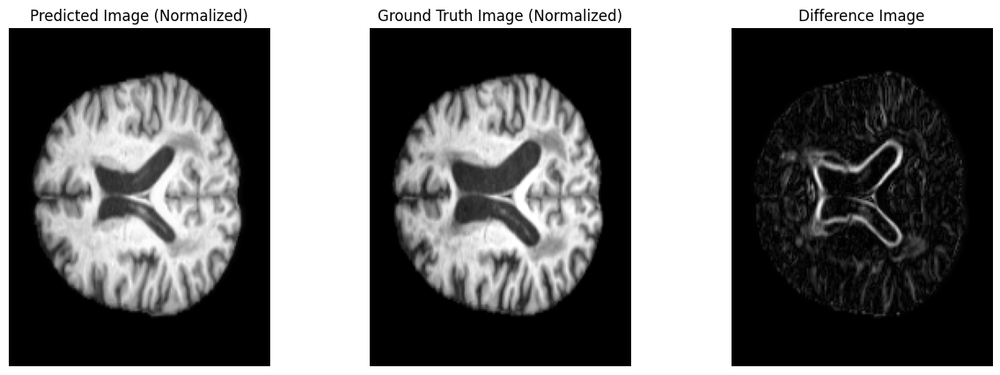

$$$$$$$$$$$$$$$$ Target age: 79.0
Age difference:  0.0
Diagnostic category: CN
$$$$$$$$$$$$$$$$ Target age: 81.0
Age difference:  2.0
Diagnostic category: MCI
Checking dimensions
pred torch.Size([1, 1, 208, 160])
gt: torch.Size([1, 1, 208, 160])
Checking intensity range
pred min: 0.0 pred max: 1.0
gt min: 0.0 gt max: 1.0
diff min: 0.0 gt max: 0.28851059079170227
pred var: tensor(0.0974, device='cuda:0')
gt var: tensor(0.0974, device='cuda:0')
MSE: 0.0009241890511475503
SSIM: 0.9389376640319824
--------


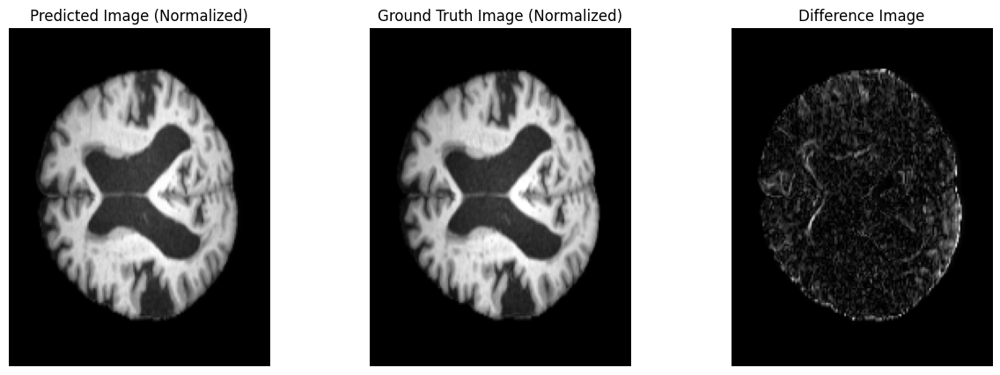

Checking dimensions
pred torch.Size([1, 1, 208, 160])
gt: torch.Size([1, 1, 208, 160])
Checking intensity range
pred min: 0.0 pred max: 1.0
gt min: 0.0 gt max: 1.0
diff min: 0.0 gt max: 0.3103519380092621
pred var: tensor(0.0965, device='cuda:0')
gt var: tensor(0.0963, device='cuda:0')
MSE: 0.0009047406492754817
SSIM: 0.9437705278396606
--------


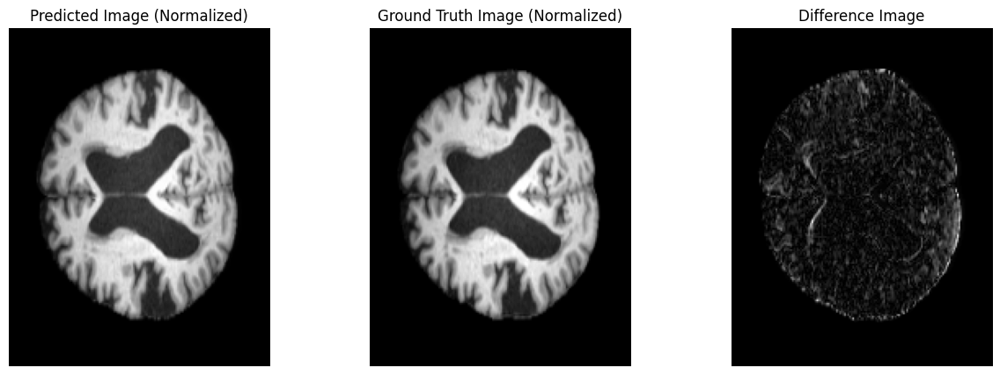

In [31]:
# For each entry, we load the initial scan, take the slices -> pass it through generator
%env CUDA_DEVICE_ORDER=PCI_BUS_ID
%env CUDA_VISIBLE_DEVICES=1
import sys
sys.path.append('/home/aarongzy/class/src')
import torch
from torch.utils.data import DataLoader
import numpy as np
import nibabel as nib
import os
from models import Generator
from data_loader import CustomImageDataset

from torchmetrics.image import StructuralSimilarityIndexMeasure as SSIM


import matplotlib.pyplot as plt
import torchvision.transforms.functional as TF

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

# Do a nested for loop with two loops. The first iterate through Patient ID, get the first scan based on its MRID, slice it and run each slice through the generator
# the second inner loops reads the scans from the same patient, 
model_path = "/home/aarongzy/class/src/trained_models/generator.pth"
gen = Generator().to(device)
gen.load_state_dict(torch.load(model_path, map_location=device))

# Function to encode the diagnosis based on predefined category mapping
def encode_diagnosis(diagnosis):
    category_mapping = {"CN": [0, 0], "MCI": [0, 1], "AD": [1, 1]}
    # Fetch the list from the mapping or default to [None, None] if diagnosis is not found
    encoded_list = category_mapping.get(diagnosis, [None, None])
    # Convert list to a 2x1 NumPy array
    return np.array(encoded_list).reshape(2, 1)

def age_vector(age):
    vector = np.zeros(100, dtype=int)
    if age < 100:  # If age is 100 or more, the vector will be all 1s
        vector[100-age:] = 1
    else:
        vector[:] = 1
    return vector


# Function to process each slice
def process_slice(slice_data):
    # Assuming your model expects a certain input shape and tensor type
    # Convert slice_data to tensor, unsqueeze to add batch dimension, etc.
    tensor = torch.from_numpy(slice_data).float().unsqueeze(0)  # Example, adjust dimensions as needed
    with torch.no_grad():  # Disable gradient computation
        output = generator(tensor)
    return output

def process(baseline_mrid, mrid, diagnosis, age_difference):
    MSE_v = []
    SSIM_v = []
    # load baseline image, ground truth image based on mrid
    data_folder_path = "/home/aarongzy/class/adni_data"
    baseline_file = os.path.join(data_folder_path, baseline_mrid, baseline_mrid+"_MNI152_registered.nii.gz")
    ground_truth_file = os.path.join(data_folder_path, mrid, mrid+"_MNI152_registered.nii.gz")
    ad = age_vector(int(age_difference))
    ho = encode_diagnosis(diagnosis).squeeze(-1)

    # read images
    baseline_img = nib.load(baseline_file).get_fdata()
    ground_truth_img = nib.load(ground_truth_file).get_fdata()

    # Compute the 99.5th percentile intensity value
    baseline_image_percentile = np.percentile(baseline_img, 99.5)
    ground_truth_image_percentile = np.percentile(ground_truth_img, 99.5)
    
    # Rescale the intensities
    baseline_img = np.clip(baseline_img, 0, baseline_image_percentile)
    ground_truth_img = np.clip(ground_truth_img, 0, ground_truth_image_percentile)
    
    # Normalize pixel values to range [-1, 1]
    baseline_img_normalized = (baseline_img / np.abs(np.max(baseline_img))) * 2 - 1
    ground_truth_img_normalized = (ground_truth_img / np.abs(np.max(ground_truth_img))) * 2 - 1

    baseline_img_normalized = baseline_img
    # ground_truth_img_normalized = ground_truth_img
    
    # Convert numpy arrays to torch tensors and send them to CUDA device
    baseline_img_tensor = torch.tensor(baseline_img_normalized, device=device, dtype=torch.float32)
    ground_truth_img_tensor = torch.tensor(ground_truth_img_normalized, device=device, dtype=torch.float32)

    # convert age_difference and diagnosis to torch tensors and send them to CUDA device
    ad = torch.tensor(ad, device=device, dtype=torch.float32)
    ho = torch.tensor(ho, device=device, dtype=torch.float32)
    
    # Slice and process image tensors on GPU
    slice_count = baseline_img_tensor.shape[2]
    central_start = max(slice_count // 2 - 2, 0)
    central_end = min(central_start + 2, slice_count)
    ground_truth_img_central_slices = ground_truth_img_tensor[:, :, central_start:central_end]
    baseline_img_central_slices = baseline_img_tensor[:, :, central_start:central_end]
    
    resize = torch.nn.functional.interpolate
    for i in range(ground_truth_img_central_slices.shape[2]):
        # print(".") 
        ground_truth_slice = ground_truth_img_central_slices[:, :, i].unsqueeze(0).unsqueeze(0)
        baseline_slice = baseline_img_central_slices[:, :, i].unsqueeze(0).unsqueeze(0)
    
        # Resize images on GPU
        ground_truth_img_reshaped = resize(ground_truth_slice, size=(208, 160), mode='bilinear', align_corners=False).squeeze(0)
        ground_truth_img_reshaped = torch.unsqueeze(ground_truth_img_reshaped, dim=1)
        baseline_img_reshaped = resize(baseline_slice, size=(208, 160), mode='bilinear', align_corners=False).squeeze(0)

        # send age_difference and diagnosis to cuda
        # pass baseline through generator
        ho = ho.view(1,2)
        ad = ad.view(1,100)
        baseline_img_reshaped = baseline_img_reshaped.view(1,1,208,160)
        # print(baseline_img_reshaped.shape)
        # print(ho.shape)
        # print(ad.shape)
        with torch.no_grad():
            pred_img = gen(baseline_img_reshaped, ho, ad) 
        
        # do a min-max normalization on both pred_img and ground_truth_slice
        pred_img_norm = (pred_img - torch.min(pred_img)) / (torch.max(pred_img) - torch.min(pred_img))
        # pred_img_norm = pred_img
        ground_truth_norm = (ground_truth_img_reshaped - torch.min(ground_truth_img_reshaped)) / (torch.max(ground_truth_img_reshaped) - torch.min(ground_truth_img_reshaped))
        diff_norm = torch.abs(pred_img_norm - ground_truth_norm)
        print("Checking dimensions")
        print("pred", pred_img_norm.shape)
        print("gt:", ground_truth_norm.shape)
        print("Checking intensity range")
        print("pred min:", torch.min(pred_img_norm).item(), "pred max:", torch.max(pred_img_norm).item())
        print("gt min:", torch.min(ground_truth_norm).item(), "gt max:", torch.max(ground_truth_norm).item())
        print("diff min:", torch.min(diff_norm).item(), "gt max:", torch.max(diff_norm).item())
        print("pred var:", torch.var(pred_img_norm))
        print("gt var:", torch.var(ground_truth_norm))
        

        # calculate MSE
        with torch.no_grad():
            mse = torch.nn.functional.mse_loss(pred_img_norm, ground_truth_norm)
            MSE_v.append(mse.item())

        # calculate SSIM
        ssim = SSIM(data_range=1.0).to(device)
        ssim_val = ssim(pred_img_norm, ground_truth_norm)
        SSIM_v.append(ssim_val.item())

        print("MSE:", mse.item())
        print("SSIM:", ssim_val.item())
        print("--------")

        # Convert tensors to numpy arrays
        pred_img_np = pred_img_norm.cpu().squeeze(0).numpy()
        ground_truth_np = ground_truth_norm.cpu().squeeze(0).numpy()
        raw_output_np = pred_img.cpu().squeeze(0).numpy()

        # Create NIfTI image objects
        pred_img_nifti = nib.Nifti1Image(pred_img_np, affine=np.eye(4))  # Assuming identity affine matrix
        ground_truth_nifti = nib.Nifti1Image(ground_truth_np, affine=np.eye(4))  # Assuming identity affine matrix

        # Save the NIfTI images as .nii.gz files
        nib.save(pred_img_nifti, "predicted_image.nii.gz")
        nib.save(ground_truth_nifti, "ground_truth_image.nii.gz")

        # Convert tensors to PIL images
        pred_img_pil = TF.to_pil_image(pred_img_norm.cpu().squeeze(0))
        ground_truth_pil = TF.to_pil_image(ground_truth_norm.cpu().squeeze(0))
        diff_pil = TF.to_pil_image(torch.abs(pred_img_norm - ground_truth_norm).cpu().squeeze(0))

        # Plotting
        fig, axes = plt.subplots(1, 3, figsize=(15, 5))

        # Plot pred_img_norm
        axes[0].imshow(pred_img_pil, cmap='gray')
        axes[0].set_title('Predicted Image (Normalized)')
        axes[0].axis('off')

        # Plot ground_truth_norm
        axes[1].imshow(ground_truth_pil, cmap='gray')
        axes[1].set_title('Ground Truth Image (Normalized)')
        axes[1].axis('off')

        # Plot the difference image
        axes[2].imshow(diff_pil, cmap='gray')
        axes[2].set_title('Difference Image')
        axes[2].axis('off')

        plt.show()
    # return metric lists
    return MSE_v, SSIM_v   

"""
for patient-ID:
    # get 1st scan of the patient
    # get the slices
    for mrid # of the same patient
        # get ho, ad encoding
        # slice ground truth
        for slices: # of the same mrid
            # call generator on corresponding 1st slice with ho, ad parameter
            # calculate MSE and SSI, append it to a list for the current health state and paitnet (1D array)
            # export the predicted image
        # concatenate all MSE and SSI arrays for the same patient (2D matrix)
    # concatenate by patient (3D matrix)
"""
mse_all = []
ssim_all = []
for patient_id in final_table['Patient ID'].unique():
    patient_data = final_table[final_table['Patient ID'] == patient_id]
    # Grab the first entry as the baseline
    baseline_scan = patient_data.iloc[0]
    baseline_mrid = baseline_scan['MRID']
    baseline_age_rounded = baseline_scan['Age-rounded']
    baseline_diagnosis = baseline_scan['Diagnosis']
    baseline_age_difference = baseline_scan['age-difference']
    assert baseline_age_difference==0.0
    

    # Iterate over each scan for the current patient
    counter = 0
    mse_cur_patient = []
    ssim_cur_patient = []
    for index, scan in patient_data.iterrows():
        counter += 1
        if counter == 7:
            break
        mrid = scan['MRID']
        diagnosis = scan['Diagnosis']
        age_difference = scan['age-difference']
        target_age = scan['Age-rounded']
        print("$$$$$$$$$$$$$$$$ Target age:", target_age)
        print("Age difference: ", age_difference)
        print("Diagnostic category:", diagnosis)

        if (age_difference != 0.0):
            # process
            mse, ssim = process(baseline_mrid, mrid, diagnosis, age_difference)
            mse_cur_patient.append(mse)
            ssim_cur_patient.append(ssim)
    mse_all.append(mse_cur_patient)
    ssim_all.append(ssim_cur_patient)



















In [32]:
# final_table

In [33]:
import statistics

# Flatten the nested list

flattened_mse = [item for sublist in mse_all for item in sublist]
flattened_flattened_mse = [item for sublist in flattened_mse for item in sublist]

# Calculate the mean
mean_mse = statistics.mean(flattened_flattened_mse)
print("Mean MSE:", mean_mse)
# Calculate the standard deviation for MSE
std_dev_mse = statistics.stdev(flattened_flattened_mse)
print("Standard Deviation MSE:", std_dev_mse)


flattened_ssim = [item for sublist in ssim_all for item in sublist]
flattened_flattened_ssim = [item for sublist in flattened_ssim for item in sublist]

# calculate mean SSMI
mean_ssim = statistics.mean(flattened_flattened_ssim)
print("Mean SSMI:", mean_ssim)
# Calculate the standard deviation for SSIM
std_dev_ssim = statistics.stdev(flattened_flattened_ssim)
print("Standard Deviation SSIM:", std_dev_ssim)


Mean MSE: 0.0028943189307548372
Standard Deviation MSE: 0.0034772926404405776
Mean SSMI: 0.9107203973191125
Standard Deviation SSIM: 0.05110082324056769
